**Swin Factorizer, SCAFFOLD**

**Imports & Drive Mount**

In [1]:
#!pip install monai nibabel torch torchvision torchmetrics -q

In [2]:
import os
import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import Dataset, DataLoader
from monai.transforms import LoadImaged, EnsureChannelFirstd, Compose, ResizeWithPadOrCropd, NormalizeIntensityd, Orientationd
# from monai.networks.nets import UNet
from monai.losses import DiceLoss
from monai.metrics import DiceMetric, HausdorffDistanceMetric
from glob import glob
import copy
#from google.colab import drive

import random
import nibabel as nib
import numpy as np

from torch.utils.tensorboard import SummaryWriter
import matplotlib.pyplot as plt
from tqdm import tqdm
import warnings
import shutil

In [3]:
#supress warnings for cleaner console output
warnings.filterwarnings("ignore", category=FutureWarning, module="monai")

In [4]:
# Mount Google Drive
# from google.colab import drive
# drive.mount('/content/drive')

data_dir = "D:/F25-156/ISLES22_split"
print(data_dir)

D:/F25-156/ISLES22_split


In [5]:
#save checkpoint and tensorboard logs in drive
checkpoint_dir = "D:/F25-156/Swin Factorizer/Federated_SwinFactorizer_checkpoints"
log_dir = "D:/F25-156/Swin Factorizer/Federated_SwinFactorizer_logs"

# Remove old directories if they exist
if os.path.exists(checkpoint_dir):
    shutil.rmtree(checkpoint_dir)

if os.path.exists(log_dir):
    shutil.rmtree(log_dir)

# Recreate directories
os.makedirs(checkpoint_dir)
os.makedirs(log_dir)

writer = SummaryWriter(log_dir=log_dir)
print(f"Checkpoints will be saved to: {checkpoint_dir}")
print(f"TensorBoard logs will be saved to: {log_dir}")

%load_ext tensorboard
%tensorboard --logdir "D:/F25-156/Swin Factorizer/Federated_SwinFactorizer_logs"

Checkpoints will be saved to: D:/F25-156/Swin Factorizer/Federated_SwinFactorizer_checkpoints
TensorBoard logs will be saved to: D:/F25-156/Swin Factorizer/Federated_SwinFactorizer_logs


In [6]:
def set_seed(seed=42):
    random.seed(seed)
    np.random.seed(seed)
    torch.manual_seed(seed)
    torch.cuda.manual_seed(seed)
    torch.cuda.manual_seed_all(seed)

    torch.backends.cudnn.deterministic = True
    torch.backends.cudnn.benchmark = False

set_seed(42)

**MONAI Preprocessing Transforms**

In [7]:
# Target shape for all volumes
target_shape = (96,96,96)

sample_transform = Compose([
    LoadImaged(keys=["image"]),
    EnsureChannelFirstd(keys=["image"]),
    Orientationd(keys=["image"], axcodes="RAS"),
    ResizeWithPadOrCropd(keys=["image"], spatial_size=target_shape),
    NormalizeIntensityd(keys=["image"], nonzero=True)
])

mask_transform = Compose([
    LoadImaged(keys=["image"]),
    EnsureChannelFirstd(keys=["image"]),
    Orientationd(keys=["image"], axcodes="RAS"),
    ResizeWithPadOrCropd(
        keys=["image"],
        spatial_size=target_shape,
        mode="constant"
    )
])


**Dataset Class**

In [8]:
def load_dwi_mask_pairs(base_path):
    dwi_files = sorted(glob(os.path.join(base_path, "DWI", "*.nii*")))
    mask_files = sorted(glob(os.path.join(base_path, "masks", "*.nii*")))
    assert len(dwi_files) == len(mask_files), f"Mismatch in {base_path}"
    return dwi_files, mask_files


In [9]:
class ISLESDataset(Dataset):
    def __init__(self, dwi_files, mask_files,
                 image_transform=None,
                 mask_transform=None):

        assert len(dwi_files) == len(mask_files)

        self.dwi_files = dwi_files
        self.mask_files = mask_files
        self.image_transform = image_transform
        self.mask_transform = mask_transform

    def __len__(self):
        return len(self.dwi_files)

    def __getitem__(self, idx):

        image_dict = {"image": self.dwi_files[idx]}
        mask_dict = {"image": self.mask_files[idx]}

        if self.image_transform:
            image_dict = self.image_transform(image_dict)

        if self.mask_transform:
            mask_dict = self.mask_transform(mask_dict)

        image = image_dict["image"].float()
        mask = mask_dict["image"].long()

        return {"image": image, "mask": mask}

**Load Files and Apply MONAI Transforms**

**Split into “Clients” (Federated Simulation)**


Client 0 - Raw Samples:
Sample 40 | Image shape: (128, 128, 25) | Mask shape: (128, 128, 25) | Mask Values: tensor([0.0000, 1.0000], dtype=torch.float64)


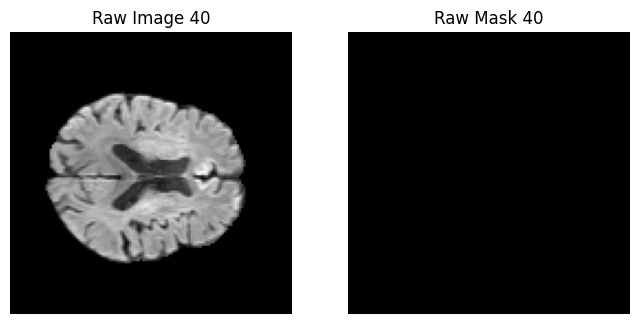

Sample 7 | Image shape: (112, 112, 73) | Mask shape: (112, 112, 73) | Mask Values: tensor([0., 1.], dtype=torch.float64)


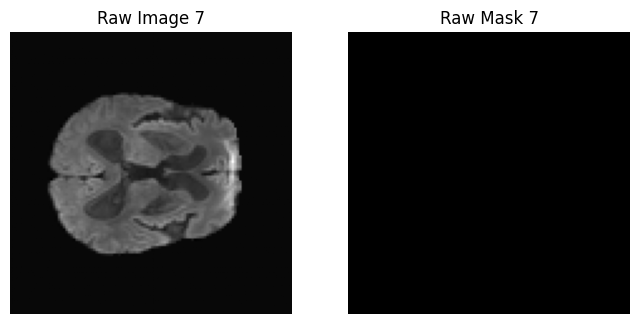

Client 0 - Preprocessed Samples:
Sample 40 | Image shape: (96, 96, 96) | Mask shape: (96, 96, 96)  | Mask Values: tensor([0, 1])


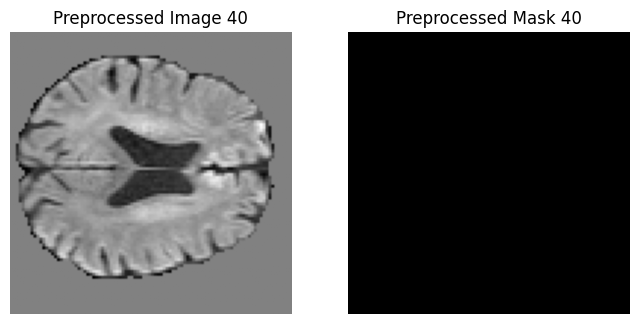

Sample 7 | Image shape: (96, 96, 96) | Mask shape: (96, 96, 96)  | Mask Values: tensor([0, 1])


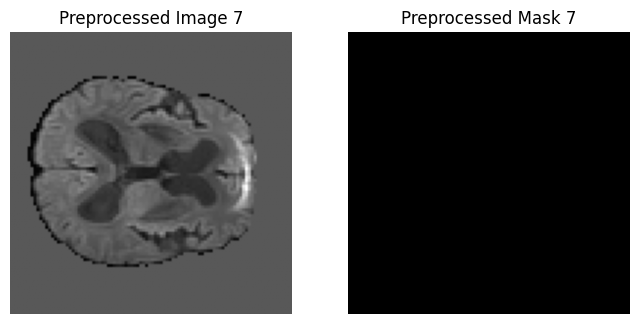

Client 0 samples: 50

Client 1 - Raw Samples:
Sample 1 | Image shape: (112, 112, 72) | Mask shape: (112, 112, 72) | Mask Values: tensor([0., 1.], dtype=torch.float64)


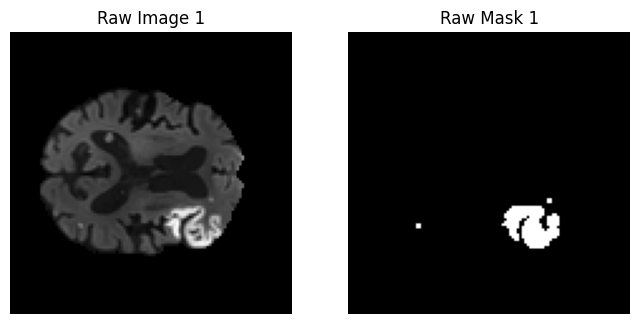

Sample 47 | Image shape: (192, 192, 30) | Mask shape: (192, 192, 30) | Mask Values: tensor([0.0000, 1.0000], dtype=torch.float64)


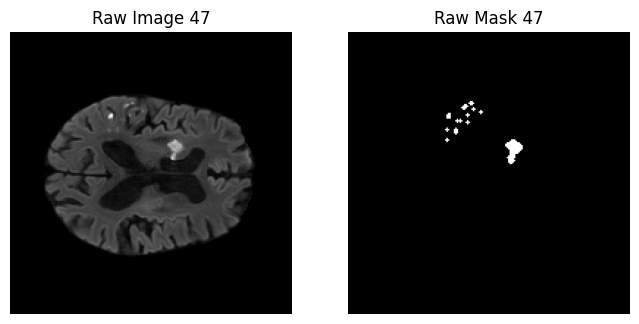

Client 1 - Preprocessed Samples:
Sample 1 | Image shape: (96, 96, 96) | Mask shape: (96, 96, 96)  | Mask Values: tensor([0, 1])


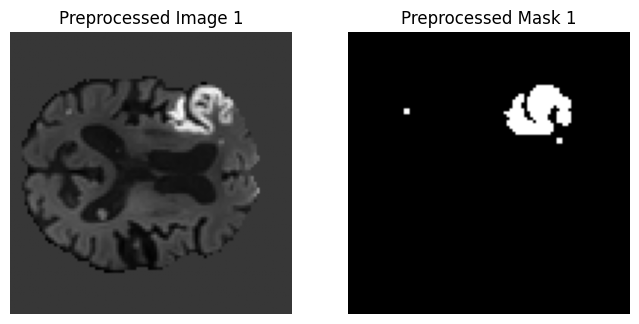

Sample 47 | Image shape: (96, 96, 96) | Mask shape: (96, 96, 96)  | Mask Values: tensor([0, 1])


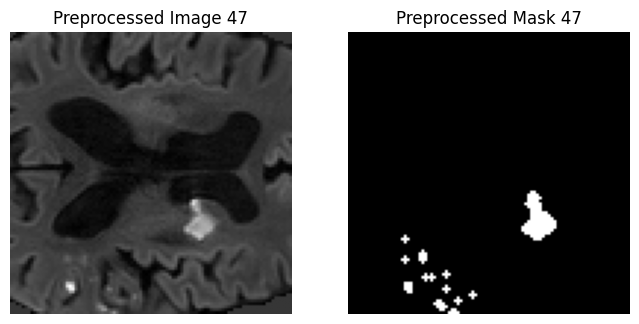

Client 1 samples: 50

Client 2 - Raw Samples:
Sample 17 | Image shape: (112, 112, 72) | Mask shape: (112, 112, 72) | Mask Values: tensor([0., 1.], dtype=torch.float64)


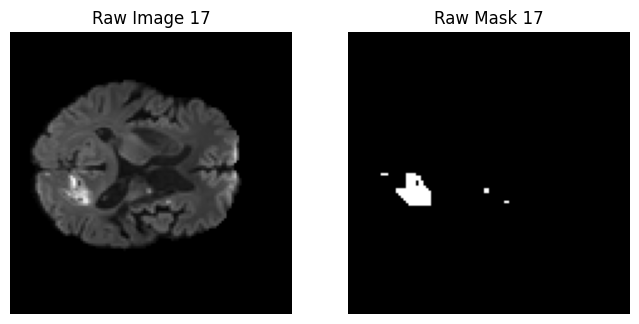

Sample 15 | Image shape: (112, 112, 72) | Mask shape: (112, 112, 72) | Mask Values: tensor([0., 1.], dtype=torch.float64)


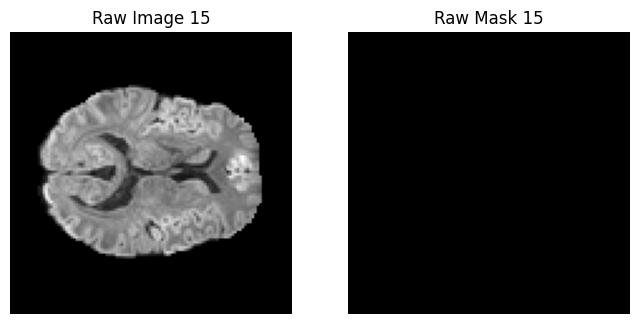

Client 2 - Preprocessed Samples:
Sample 17 | Image shape: (96, 96, 96) | Mask shape: (96, 96, 96)  | Mask Values: tensor([0, 1])


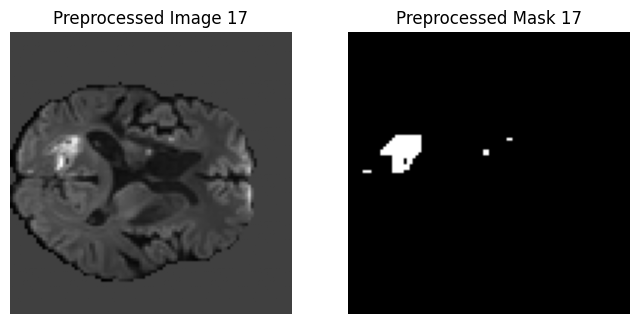

Sample 15 | Image shape: (96, 96, 96) | Mask shape: (96, 96, 96)  | Mask Values: tensor([0, 1])


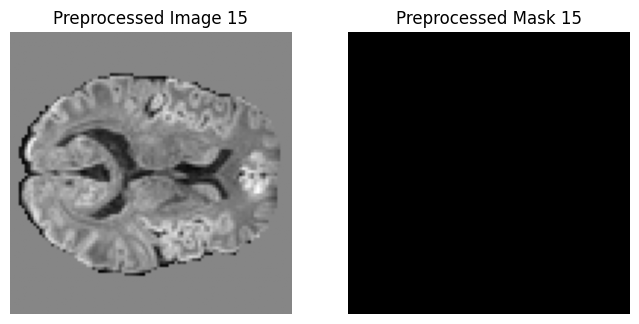

Client 2 samples: 50


In [10]:
num_clients = 3
client_datasets = []

for i in range(num_clients):
    client_path = os.path.join(data_dir, "train", f"client_{i}")
    dwi_files, mask_files = load_dwi_mask_pairs(client_path)

    # -----------------------------
    # Visualize 2 random raw samples
    # -----------------------------
    sample_indices = random.sample(range(len(dwi_files)), k=2)
    print(f"\nClient {i} - Raw Samples:")
    for idx in sample_indices:
        img = nib.load(dwi_files[idx]).get_fdata()
        mask = nib.load(mask_files[idx]).get_fdata()
        mask_tensor = torch.from_numpy(mask)
        
        print(f"Sample {idx} | Image shape: {img.shape} | Mask shape: {mask.shape} | Mask Values: {torch.unique(mask_tensor)}")  #make sure mask only contains 0 and 1

        mid_slice = img.shape[2] // 2  # middle slice
        plt.figure(figsize=(8,4))
        plt.subplot(1,2,1)
        plt.imshow(img[:,:,mid_slice], cmap="gray")
        plt.title(f"Raw Image {idx}")
        plt.axis("off")
        plt.subplot(1,2,2)
        plt.imshow(mask[:,:,mid_slice], cmap="gray")
        plt.title(f"Raw Mask {idx}")
        plt.axis("off")
        plt.show()

    # -----------------------------
    # Create preprocessed dataset
    # -----------------------------
    ds = ISLESDataset(
        dwi_files=dwi_files,
        mask_files=mask_files,
        image_transform=sample_transform,
        mask_transform=mask_transform
    )
    client_datasets.append(ds)

    # -----------------------------
    # Visualize 2 random preprocessed samples
    # -----------------------------
    print(f"Client {i} - Preprocessed Samples:")
    for idx in sample_indices:
        sample = ds[idx]
        img_proc = sample["image"][0].numpy()  # remove channel
        mask_proc = sample["mask"][0].numpy()
        print(f"Sample {idx} | Image shape: {img_proc.shape} | Mask shape: {mask_proc.shape}  | Mask Values: {torch.unique(sample['mask'])}")

        mid_slice = img_proc.shape[2] // 2
        plt.figure(figsize=(8,4))
        plt.subplot(1,2,1)
        plt.imshow(img_proc[:,:,mid_slice], cmap="gray")
        plt.title(f"Preprocessed Image {idx}")
        plt.axis("off")
        plt.subplot(1,2,2)
        plt.imshow(mask_proc[:,:,mid_slice], cmap="gray")
        plt.title(f"Preprocessed Mask {idx}")
        plt.axis("off")
        plt.show()

    print(f"Client {i} samples: {len(ds)}")

**Validation Set**

In [11]:
val_dwi, val_masks = load_dwi_mask_pairs(os.path.join(data_dir, "val"))

val_dataset = ISLESDataset(
    dwi_files=val_dwi,
    mask_files=val_masks,
    image_transform=sample_transform,
    mask_transform=mask_transform
)

val_loader = DataLoader(val_dataset, batch_size=1, shuffle=False)

print("Validation samples:", len(val_dataset))

Validation samples: 50


Swin Factorizer

In [12]:
print("CUDA version:", torch.version.cuda)
print("CUDA available:", torch.cuda.is_available())

if torch.cuda.is_available():
    print("GPU:", torch.cuda.get_device_name(0))

CUDA version: 12.1
CUDA available: True
GPU: NVIDIA RTX A4000


In [13]:
device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
print("Using device:", device)

Using device: cuda:0


In [14]:
!pip install git+https://github.com/pashtari/factorizer.git

  Cloning https://github.com/pashtari/factorizer.git to C:\Users\LAB\AppData\Local\Temp\pip-req-build-ana9yqg_
  Resolved https://github.com/pashtari/factorizer.git to commit 9adcc5d3c5178d458f5720125ce450e7696f1e09
  Installing build dependencies: started
  Installing build dependencies: finished with status 'done'
  Getting requirements to build wheel: started
  Getting requirements to build wheel: finished with status 'done'
  Preparing metadata (pyproject.toml): started
  Preparing metadata (pyproject.toml): finished with status 'done'


  Running command git clone --filter=blob:none --quiet https://github.com/pashtari/factorizer.git 'C:\Users\LAB\AppData\Local\Temp\pip-req-build-ana9yqg_'


In [15]:
import factorizer as ft

In [16]:
def create_model():
    model = ft.Factorizer(
        in_channels=1,
        out_channels=1,
        spatial_size=target_shape,
        encoder_depth=(1, 1, 1, 1),
        encoder_width=(32, 64, 128, 256),
        strides=(1, 2, 2, 2, 2),
        decoder_depth=(1, 1, 1, 1),
        norm=ft.LayerNorm,
        reshape=(ft.SWMatricize, {'head_dim': 8, 'patch_size': 2}),
        act=nn.ReLU,
        factorize=ft.NMF, 
        rank=1,
        num_iters=3,
        init="uniform",
        solver="hals",
        mlp_ratio=2,
        dropout=0.1
    ).to(device)
    print(model)
    return model

**Client Class**

In [17]:
class Client:
    def __init__(self, client_id, dataset, device):
        self.id = client_id
        self.loader = DataLoader(dataset, batch_size=1, shuffle=True)
        self.device = device
        self.model = create_model().to(device)
        self.optimizer = optim.SGD(self.model.parameters(), lr=1e-2, momentum=0) #SCAFFOLD uses SGD instead of Adam
        
        # --- SCAFFOLD CHANGE START ---
        # client control variate c_i
        self.c_i = {name: torch.zeros_like(param).to(device) 
                    for name, param in self.model.named_parameters()}
        # --- SCAFFOLD CHANGE END ---

        self.dice_loss = DiceLoss(sigmoid=True)
        self.bce_loss = nn.BCEWithLogitsLoss()

        self.dice_metric = DiceMetric(include_background=False, reduction="mean")
        self.hd_metric = HausdorffDistanceMetric(include_background=False, percentile=95, reduction="mean")

    def loss_fn(self, y_pred, y_true):
        return 0.7*self.dice_loss(y_pred, y_true) + 0.3*self.bce_loss(y_pred, y_true)

    def get_parameters(self):
        return {k: v.cpu().clone() for k, v in self.model.state_dict().items()}

    def set_parameters(self, parameters):
        self.model.load_state_dict(parameters)
        
    # --- SCAFFOLD CHANGE START ---
    # server also sends control variate c
    def set_server_control(self, c):
        self.c = {k: v.clone().to(self.device) for k, v in c.items()}
    # --- SCAFFOLD CHANGE END ---


    def train_epochs(self, num_epochs=1):
        self.model.train()
        total_loss = 0
        
        # --- SCAFFOLD CHANGE START ---
        # store initial parameters to compute update later
        global_params = {name: param.clone().detach()
                         for name, param in self.model.named_parameters()}
        # count local steps
        local_steps = 0
        # --- SCAFFOLD CHANGE END ---

        # Progress bar for epochs
        for epoch in tqdm(range(1, num_epochs + 1), desc=f"Client {self.id} Epochs", leave=True):
            epoch_loss = 0

            for batch in self.loader:
                images = batch["image"].to(self.device, dtype=torch.float32)
                masks = batch["mask"].to(self.device, dtype=torch.float32)

                self.optimizer.zero_grad()
                outputs = self.model(images)
                loss = self.loss_fn(outputs, masks)

                loss.backward()
                
                # --- SCAFFOLD CHANGE START ---
                # modify gradients using control variates
                for name, param in self.model.named_parameters():
                    if param.grad is not None:
                        param.grad -= self.c_i[name]
                        param.grad += self.c[name]
                # --- SCAFFOLD CHANGE END ---
                
                self.optimizer.step()
                local_steps += 1

                total_loss += loss.item()
                epoch_loss += loss.item()

                # Metrics for monitoring
                pred_binary = (torch.sigmoid(outputs) > 0.5).float()
                self.dice_metric(pred_binary, masks)
                if masks.sum() > 0 and pred_binary.sum() > 0:
                  self.hd_metric(pred_binary, masks)

            # Compute metrics at the end of the epoch
            mean_dice = self.dice_metric.aggregate().item()
            # mean_hd95 = self.hd_metric.aggregate().item()
            try:
                mean_hd95 = self.hd_metric.aggregate().item()
            except ValueError:
                mean_hd95 = float('nan')  # or 0
            mean_iou = mean_dice / (2 - mean_dice)

            # Print per-epoch metrics
            print(f"Client {self.id} | Epoch {epoch}/{num_epochs} | "
                  f"Loss: {epoch_loss/len(self.loader):.4f} | Dice: {mean_dice:.4f} | "
                  f"IoU: {mean_iou:.4f} | HD95: {mean_hd95:.4f}")

            # Reset metrics for next epoch
            self.dice_metric.reset()
            self.hd_metric.reset()

        # Average loss across all epochs
        avg_loss = total_loss / (len(self.loader) * num_epochs)
        
        # --- SCAFFOLD CHANGE START ---
        # update client control variate
        new_c_i = {}
        delta_c_i = {}

        lr = self.optimizer.param_groups[0]["lr"] 
        for name, param in self.model.named_parameters():
            # diff = (initial_params - final_params)
            diff = global_params[name] - param.detach()
            
            # K is local_steps (total batches processed)
            # new_c_i_plus = c_i - c + (diff / (K * lr))
            new_c_i_plus = self.c_i[name] - self.c[name] + (diff / (local_steps * lr))

            delta_c_i[name] = new_c_i_plus - self.c_i[name]
            new_c_i[name] = new_c_i_plus

        # update client control
        self.c_i = new_c_i
        print("mean |c_i|:", torch.mean(
            torch.stack([v.abs().mean() for v in self.c_i.values()])
        ))
        print("max |c_i|:", max(v.abs().max().item() for v in self.c_i.values()))
        # --- SCAFFOLD CHANGE END ---

        # Return last epoch metrics 
        return avg_loss, mean_dice, mean_iou, mean_hd95, delta_c_i

**Server Class**

In [18]:
class Server:
    def __init__(self, val_loader, device, server_lr=1):
        self.device = device
        self.global_model = create_model().to(device)
        self.val_loader = val_loader
        self.server_lr=server_lr #ng
        
        # --- SCAFFOLD CHANGE START ---
        # server control variate
        self.c = {name: torch.zeros_like(param).to(device)
            for name, param in self.global_model.named_parameters()}
        # --- SCAFFOLD CHANGE END ---

        self.dice_loss = DiceLoss(sigmoid=True)
        self.bce_loss = nn.BCEWithLogitsLoss()

        self.dice_metric = DiceMetric(include_background=False, reduction="mean")
        self.hd_metric = HausdorffDistanceMetric(include_background=False, percentile=95, reduction="mean")

        self.best_dice = 0.0

    def loss_fn(self, y_pred, y_true):
        return 0.7*self.dice_loss(y_pred, y_true) + \
               0.3*self.bce_loss(y_pred, y_true)

    
    def aggregate(self, client_params_list, delta_c_list):

        global_params = self.global_model.state_dict()
        new_params = {}
        
        # find delta (new clients - old global)
        for key in global_params.keys():

            # if not a learnable parameter (not a float tensor), skip it
            if not torch.is_floating_point(global_params[key]):
                new_params[key] = global_params[key]
                continue

            delta = torch.zeros_like(global_params[key])

            for client in client_params_list:
                delta += client[key].to(self.device) - global_params[key]

            delta /= len(client_params_list)  # |S|

            new_params[key] = global_params[key] + self.server_lr * delta

        self.global_model.load_state_dict(new_params)

        # ---- Control variate update ----
        for name in self.c.keys():

            update = torch.zeros_like(self.c[name])

            for delta_c in delta_c_list:
                update += delta_c[name].to(self.device)

            update /= num_clients   # 1/N

            self.c[name] += update

    def distribute(self, clients):
        global_params = self.global_model.state_dict()
        for client in clients:
            client.set_parameters(global_params)
            
            # --- SCAFFOLD CHANGE START ---
            # send server control variate to clients
            client.set_server_control(self.c)
            # --- SCAFFOLD CHANGE END ---

    def validate(self):
        self.global_model.eval()
        val_loss = 0

        with torch.no_grad():
            for batch in self.val_loader:
                images = batch["image"].to(self.device, dtype=torch.float32)
                masks = batch["mask"].to(self.device, dtype=torch.float32)

                outputs = self.global_model(images)
                loss = self.loss_fn(outputs, masks)
                val_loss += loss.item()

                pred_binary = (torch.sigmoid(outputs) > 0.5).float()
                self.dice_metric(pred_binary, masks)
                if masks.sum() > 0 and pred_binary.sum() > 0:
                  self.hd_metric(pred_binary, masks)

        avg_loss = val_loss / len(self.val_loader)
        mean_dice = self.dice_metric.aggregate().item()
        # mean_hd95 = self.hd_metric.aggregate().item()
        try:
            mean_hd95 = self.hd_metric.aggregate().item()
        except ValueError:
            mean_hd95 = float('nan')  # or 0
        mean_iou = mean_dice / (2 - mean_dice)

        self.dice_metric.reset()
        self.hd_metric.reset()

        # Save best global model
        if mean_dice > self.best_dice:
            self.best_dice = mean_dice
            torch.save({
                "model_state_dict": self.global_model.state_dict(),
                "dice": mean_dice
            }, "best_global_model.pth")
            print(f"Best global model updated with Dice={mean_dice:.4f}")


        return avg_loss, mean_dice, mean_iou, mean_hd95

In [19]:
#create client and server objects
clients = [
    Client(client_id=i, dataset=client_datasets[i], device=device)
    for i in range(num_clients)
]

server = Server(val_loader=val_loader, device=device)

Factorizer(
  (stem): Conv3d(1, 32, kernel_size=(3, 3, 3), stride=(1, 1, 1), padding=(1, 1, 1), bias=False)
  (encoder): UNetEncoder(
    (blocks): ModuleList(
      (0): UNetEncoderBlock(
        (downsample): Identity()
        (block): FactorizerStage(
          (pos_embed): Identity()
          (blocks): ModuleList(
            (0): FactorizerBlock(
              (norm1): LayerNorm(
                (norm): LayerNorm((32,), eps=1e-05, elementwise_affine=True)
              )
              (fact): FactMixer(
                (in_proj): Linear(
                  (flatten): Flatten(start_dim=2, end_dim=-1)
                  (linear): Conv1d(32, 32, kernel_size=(1,), stride=(1,), bias=False)
                )
                (reshape): SWMatricize(
                  (shifted_windows): ModuleList(
                    (0-1): 2 x Matricize(
                      (rearrange): Rearrange('b (h d) (g0 p0) (g1 p1) (g2 p2) -> (b h) (g0 g1 g2) d (p0 p1 p2)', d=8, p0=2, p1=2, p2=2)
                

**Federated Training loop**

In [20]:
communication_rounds = 10  # upper bound
local_epochs = 20
dice_threshold = 0.001

# ---- Added early stopping tracking ----
no_improve_rounds = 0
patience = 2   # stop if Dice does not improve for 2 rounds
# --------------------------------------

global_history = {"dice": [], "loss": [], "iou": [], "hd95": []}
client_history = {client.id: {"loss": [], "dice": [], "iou": [], "hd95": []} for client in clients}

previous_dice = 0

for round_num in range(1, communication_rounds + 1):

    print(f"\n--- Communication Round {round_num} ---")

    # ---- Distribute global model ----
    server.distribute(clients)

    client_params = []
    delta_c_list = []

    # ---- Local Training ----
    for client in tqdm(clients, desc="Clients Training", leave=False):

        # train_epochs already runs for `local_epochs`
        train_loss, train_dice, train_iou, train_hd95, delta_c_i = client.train_epochs(local_epochs)

        # Save per-client metrics
        client_history[client.id]["loss"].append(train_loss)
        client_history[client.id]["dice"].append(train_dice)
        client_history[client.id]["iou"].append(train_iou)
        client_history[client.id]["hd95"].append(train_hd95)

        # TensorBoard logging
        writer.add_scalar(f"Client_{client.id}/Loss", train_loss, round_num)
        writer.add_scalar(f"Client_{client.id}/Dice", train_dice, round_num)
        writer.add_scalar(f"Client_{client.id}/IoU", train_iou, round_num)
        writer.add_scalar(f"Client_{client.id}/HD95", train_hd95, round_num)


        client_params.append(client.get_parameters())
        delta_c_list.append(delta_c_i)

        tqdm.write(f"Client {client.id} | Loss={train_loss:.4f} | Dice={train_dice:.4f} | IoU={train_iou:.4f} | HD95={train_hd95:.4f}")
    # ---- Aggregate client models ----
    server.aggregate(client_params, delta_c_list)

    # ---- Validation on global model ----
    val_loss, val_dice, val_iou, val_hd95 = server.validate()

    global_history["loss"].append(val_loss)
    global_history["dice"].append(val_dice)
    global_history["iou"].append(val_iou)
    global_history["hd95"].append(val_hd95)

    # TensorBoard logging
    writer.add_scalar("Global/Val_Loss", val_loss, round_num)
    writer.add_scalar("Global/Val_Dice", val_dice, round_num)
    writer.add_scalar("Global/Val_IoU", val_iou, round_num)
    writer.add_scalar("Global/Val_HD95", val_hd95, round_num)


    print(f"Global | Val Loss={val_loss:.4f} | Dice={val_dice:.4f} | IoU={val_iou:.4f} | HD95={val_hd95:.4f}")

    # Save checkpoint of current round
    checkpoint_path = os.path.join(checkpoint_dir, f"federated_round{round_num}.pth")
    torch.save({
        "round": round_num,
        "global_model_state_dict": server.global_model.state_dict(),
        "global_val_loss": val_loss,
        "global_val_dice": val_dice,
        "global_val_iou": val_iou,
        "global_val_hd95": val_hd95,
        "client_history": client_history
    }, checkpoint_path)
    print(f"Checkpoint saved for round {round_num} at {checkpoint_path}")

     # ---- Early stopping check based on validation Dice ----
    if val_dice > previous_dice + dice_threshold:
        no_improve_rounds = 0
    else:
        no_improve_rounds += 1
        print(f"No significant Dice improvement for {no_improve_rounds} round(s)")

    if no_improve_rounds >= patience:
        print(f"Early stopping triggered at round {round_num} (no Dice improvement for {patience} rounds)")
        break
    # -------------------------------------------------------

    previous_dice = val_dice

writer.close()


--- Communication Round 1 ---


Clients Training:   0%|          | 0/3 [00:00<?, ?it/s]

Client 0 | Epoch 1/20 | Loss: 0.8254 | Dice: 0.0906 | IoU: 0.0475 | HD95: 43.1600


Client 0 | Epoch 2/20 | Loss: 0.7418 | Dice: 0.0856 | IoU: 0.0447 | HD95: 36.3278


Client 0 | Epoch 3/20 | Loss: 0.7072 | Dice: 0.1880 | IoU: 0.1037 | HD95: 34.6760


Client 0 | Epoch 4/20 | Loss: 0.6751 | Dice: 0.2594 | IoU: 0.1490 | HD95: 35.0117


Client 0 | Epoch 5/20 | Loss: 0.6338 | Dice: 0.2494 | IoU: 0.1425 | HD95: 36.0383


Client 0 | Epoch 6/20 | Loss: 0.5886 | Dice: 0.2687 | IoU: 0.1552 | HD95: 36.1384


Client 0 | Epoch 7/20 | Loss: 0.5528 | Dice: 0.2817 | IoU: 0.1640 | HD95: 35.8026


Client 0 | Epoch 8/20 | Loss: 0.5332 | Dice: 0.2876 | IoU: 0.1679 | HD95: 36.1269


Client 0 | Epoch 9/20 | Loss: 0.5229 | Dice: 0.2932 | IoU: 0.1718 | HD95: 35.6595


Client 0 | Epoch 10/20 | Loss: 0.5175 | Dice: 0.2943 | IoU: 0.1726 | HD95: 36.0528


Client 0 | Epoch 11/20 | Loss: 0.5156 | Dice: 0.2935 | IoU: 0.1720 | HD95: 35.9424


Client 0 | Epoch 12/20 | Loss: 0.5077 | Dice: 0.3032 | IoU: 0.1787 | HD95: 35.8499


Client 0 | Epoch 13/20 | Loss: 0.5109 | Dice: 0.2977 | IoU: 0.1749 | HD95: 35.7054


Client 0 | Epoch 14/20 | Loss: 0.5068 | Dice: 0.3027 | IoU: 0.1783 | HD95: 36.0387


Client 0 | Epoch 15/20 | Loss: 0.5060 | Dice: 0.3031 | IoU: 0.1786 | HD95: 36.1676


Client 0 | Epoch 16/20 | Loss: 0.5026 | Dice: 0.3070 | IoU: 0.1813 | HD95: 35.3252


Client 0 | Epoch 17/20 | Loss: 0.5030 | Dice: 0.3054 | IoU: 0.1802 | HD95: 35.9881


Client 0 | Epoch 18/20 | Loss: 0.5000 | Dice: 0.3090 | IoU: 0.1828 | HD95: 36.0742


Client 0 | Epoch 19/20 | Loss: 0.5034 | Dice: 0.3051 | IoU: 0.1800 | HD95: 35.6221


Clients Training:  33%|███▎      | 1/3 [10:20<20:40, 620.46s/it]

Client 0 | Epoch 20/20 | Loss: 0.5012 | Dice: 0.3080 | IoU: 0.1821 | HD95: 35.9590
mean |c_i|: tensor(0.0004, device='cuda:0')
max |c_i|: 0.028131812810897827
Client 0 | Loss=0.5678 | Dice=0.3080 | IoU=0.1821 | HD95=35.9590


Client 1 | Epoch 1/20 | Loss: 0.8250 | Dice: 0.0600 | IoU: 0.0309 | HD95: 40.6498


Client 1 | Epoch 2/20 | Loss: 0.7421 | Dice: 0.0641 | IoU: 0.0331 | HD95: 34.4403


Client 1 | Epoch 3/20 | Loss: 0.7086 | Dice: 0.1909 | IoU: 0.1055 | HD95: 32.5162


Client 1 | Epoch 4/20 | Loss: 0.6770 | Dice: 0.2891 | IoU: 0.1690 | HD95: 33.5180


Client 1 | Epoch 5/20 | Loss: 0.6307 | Dice: 0.2694 | IoU: 0.1557 | HD95: 33.7088


Client 1 | Epoch 6/20 | Loss: 0.5706 | Dice: 0.2984 | IoU: 0.1753 | HD95: 33.8089


Client 1 | Epoch 7/20 | Loss: 0.5277 | Dice: 0.3119 | IoU: 0.1848 | HD95: 33.7708


Client 1 | Epoch 8/20 | Loss: 0.5066 | Dice: 0.3171 | IoU: 0.1884 | HD95: 34.1623


Client 1 | Epoch 9/20 | Loss: 0.4948 | Dice: 0.3260 | IoU: 0.1947 | HD95: 34.2187


Client 1 | Epoch 10/20 | Loss: 0.4925 | Dice: 0.3230 | IoU: 0.1926 | HD95: 34.3597


Client 1 | Epoch 11/20 | Loss: 0.4926 | Dice: 0.3198 | IoU: 0.1903 | HD95: 33.5683


Client 1 | Epoch 12/20 | Loss: 0.4883 | Dice: 0.3237 | IoU: 0.1931 | HD95: 34.1977


Client 1 | Epoch 13/20 | Loss: 0.4872 | Dice: 0.3240 | IoU: 0.1933 | HD95: 34.1254


Client 1 | Epoch 14/20 | Loss: 0.4846 | Dice: 0.3274 | IoU: 0.1957 | HD95: 34.2529


Client 1 | Epoch 15/20 | Loss: 0.4828 | Dice: 0.3279 | IoU: 0.1961 | HD95: 34.1889


Client 1 | Epoch 16/20 | Loss: 0.4833 | Dice: 0.3277 | IoU: 0.1960 | HD95: 33.5922


Client 1 | Epoch 17/20 | Loss: 0.4841 | Dice: 0.3252 | IoU: 0.1941 | HD95: 34.0289


Client 1 | Epoch 18/20 | Loss: 0.4812 | Dice: 0.3287 | IoU: 0.1967 | HD95: 33.8896


Client 1 | Epoch 19/20 | Loss: 0.4816 | Dice: 0.3281 | IoU: 0.1963 | HD95: 34.1977


Clients Training:  67%|██████▋   | 2/3 [20:43<10:21, 621.95s/it]

Client 1 | Epoch 20/20 | Loss: 0.4806 | Dice: 0.3296 | IoU: 0.1973 | HD95: 34.2054
mean |c_i|: tensor(0.0004, device='cuda:0')
max |c_i|: 0.028552526608109474
Client 1 | Loss=0.5511 | Dice=0.3296 | IoU=0.1973 | HD95=34.2054


Client 2 | Epoch 1/20 | Loss: 0.8223 | Dice: 0.0928 | IoU: 0.0487 | HD95: 41.7648


Client 2 | Epoch 2/20 | Loss: 0.7373 | Dice: 0.1466 | IoU: 0.0791 | HD95: 34.7353


Client 2 | Epoch 3/20 | Loss: 0.6976 | Dice: 0.2977 | IoU: 0.1749 | HD95: 34.6835


Client 2 | Epoch 4/20 | Loss: 0.6466 | Dice: 0.3278 | IoU: 0.1960 | HD95: 36.2323


Client 2 | Epoch 5/20 | Loss: 0.5659 | Dice: 0.3431 | IoU: 0.2071 | HD95: 36.3588


Client 2 | Epoch 6/20 | Loss: 0.5019 | Dice: 0.3557 | IoU: 0.2163 | HD95: 35.9920


Client 2 | Epoch 7/20 | Loss: 0.4792 | Dice: 0.3584 | IoU: 0.2183 | HD95: 35.7195


Client 2 | Epoch 8/20 | Loss: 0.4652 | Dice: 0.3663 | IoU: 0.2242 | HD95: 36.6443


Client 2 | Epoch 9/20 | Loss: 0.4650 | Dice: 0.3610 | IoU: 0.2202 | HD95: 35.3611


Client 2 | Epoch 10/20 | Loss: 0.4606 | Dice: 0.3637 | IoU: 0.2222 | HD95: 35.6962


Client 2 | Epoch 11/20 | Loss: 0.4566 | Dice: 0.3686 | IoU: 0.2259 | HD95: 35.3646


Client 2 | Epoch 12/20 | Loss: 0.4569 | Dice: 0.3668 | IoU: 0.2246 | HD95: 35.5299


Client 2 | Epoch 13/20 | Loss: 0.4525 | Dice: 0.3714 | IoU: 0.2280 | HD95: 35.5029


Client 2 | Epoch 14/20 | Loss: 0.4523 | Dice: 0.3713 | IoU: 0.2280 | HD95: 35.3335


Client 2 | Epoch 15/20 | Loss: 0.4501 | Dice: 0.3744 | IoU: 0.2303 | HD95: 35.6098


Client 2 | Epoch 16/20 | Loss: 0.4526 | Dice: 0.3691 | IoU: 0.2263 | HD95: 35.7997


Client 2 | Epoch 17/20 | Loss: 0.4472 | Dice: 0.3770 | IoU: 0.2323 | HD95: 35.5275


Client 2 | Epoch 18/20 | Loss: 0.4509 | Dice: 0.3714 | IoU: 0.2281 | HD95: 35.4844


Client 2 | Epoch 19/20 | Loss: 0.4496 | Dice: 0.3728 | IoU: 0.2291 | HD95: 35.4060


Client 2 Epochs: 100%|██████████| 20/20 [10:21<00:00, 31.06s/it]

Client 2 | Epoch 20/20 | Loss: 0.4465 | Dice: 0.3778 | IoU: 0.2329 | HD95: 35.5041
mean |c_i|: tensor(0.0004, device='cuda:0')
max |c_i|: 0.028494149446487427


Client 2 | Loss=0.5178 | Dice=0.3778 | IoU=0.2329 | HD95=35.5041
Best global model updated with Dice=0.3021
Global | Val Loss=0.5018 | Dice=0.3021 | IoU=0.1780 | HD95=39.4568
Checkpoint saved for round 1 at D:/F25-156/Swin Factorizer/Federated_SwinFactorizer_checkpoints\federated_round1.pth

--- Communication Round 2 ---


Clients Training:   0%|          | 0/3 [00:00<?, ?it/s]

Client 0 | Epoch 1/20 | Loss: 0.5002 | Dice: 0.3079 | IoU: 0.1820 | HD95: 35.8616


Client 0 | Epoch 2/20 | Loss: 0.4961 | Dice: 0.3138 | IoU: 0.1861 | HD95: 35.7692


Client 0 | Epoch 3/20 | Loss: 0.5009 | Dice: 0.3075 | IoU: 0.1817 | HD95: 35.9105


Client 0 | Epoch 4/20 | Loss: 0.4994 | Dice: 0.3099 | IoU: 0.1834 | HD95: 35.6593


Client 0 | Epoch 5/20 | Loss: 0.4987 | Dice: 0.3096 | IoU: 0.1831 | HD95: 36.0695


Client 0 | Epoch 6/20 | Loss: 0.4974 | Dice: 0.3127 | IoU: 0.1853 | HD95: 35.9622


Client 0 | Epoch 7/20 | Loss: 0.4972 | Dice: 0.3126 | IoU: 0.1853 | HD95: 36.0269


Client 0 | Epoch 8/20 | Loss: 0.4978 | Dice: 0.3119 | IoU: 0.1848 | HD95: 36.1456


Client 0 | Epoch 9/20 | Loss: 0.4907 | Dice: 0.3217 | IoU: 0.1917 | HD95: 36.0650


Client 0 | Epoch 10/20 | Loss: 0.4959 | Dice: 0.3149 | IoU: 0.1869 | HD95: 36.0810


Client 0 | Epoch 11/20 | Loss: 0.4976 | Dice: 0.3123 | IoU: 0.1850 | HD95: 35.7992


Client 0 | Epoch 12/20 | Loss: 0.4964 | Dice: 0.3132 | IoU: 0.1857 | HD95: 35.8917


Client 0 | Epoch 13/20 | Loss: 0.4943 | Dice: 0.3165 | IoU: 0.1880 | HD95: 36.2133


Client 0 | Epoch 14/20 | Loss: 0.4953 | Dice: 0.3148 | IoU: 0.1868 | HD95: 35.9791


Client 0 | Epoch 15/20 | Loss: 0.4948 | Dice: 0.3150 | IoU: 0.1870 | HD95: 35.7157


Client 0 | Epoch 16/20 | Loss: 0.4944 | Dice: 0.3165 | IoU: 0.1880 | HD95: 35.7715


Client 0 | Epoch 17/20 | Loss: 0.4921 | Dice: 0.3192 | IoU: 0.1899 | HD95: 36.1146


Client 0 | Epoch 18/20 | Loss: 0.4891 | Dice: 0.3236 | IoU: 0.1930 | HD95: 36.2588


Client 0 | Epoch 19/20 | Loss: 0.4911 | Dice: 0.3217 | IoU: 0.1917 | HD95: 36.0331


Clients Training:  33%|███▎      | 1/3 [10:16<20:32, 616.37s/it]

Client 0 | Epoch 20/20 | Loss: 0.4924 | Dice: 0.3191 | IoU: 0.1899 | HD95: 36.0385
mean |c_i|: tensor(5.2497e-05, device='cuda:0')
max |c_i|: 0.002388555556535721
Client 0 | Loss=0.4956 | Dice=0.3191 | IoU=0.1899 | HD95=36.0385


Client 1 | Epoch 1/20 | Loss: 0.4798 | Dice: 0.3310 | IoU: 0.1983 | HD95: 33.8837


Client 1 | Epoch 2/20 | Loss: 0.4793 | Dice: 0.3309 | IoU: 0.1983 | HD95: 34.1358


Client 1 | Epoch 3/20 | Loss: 0.4776 | Dice: 0.3333 | IoU: 0.2000 | HD95: 34.3235


Client 1 | Epoch 4/20 | Loss: 0.4790 | Dice: 0.3310 | IoU: 0.1983 | HD95: 34.3866


Client 1 | Epoch 5/20 | Loss: 0.4757 | Dice: 0.3368 | IoU: 0.2025 | HD95: 34.1536


Client 1 | Epoch 6/20 | Loss: 0.4790 | Dice: 0.3313 | IoU: 0.1986 | HD95: 33.9018


Client 1 | Epoch 7/20 | Loss: 0.4757 | Dice: 0.3353 | IoU: 0.2014 | HD95: 33.5123


Client 1 | Epoch 8/20 | Loss: 0.4769 | Dice: 0.3340 | IoU: 0.2005 | HD95: 33.9897


Client 1 | Epoch 9/20 | Loss: 0.4764 | Dice: 0.3345 | IoU: 0.2009 | HD95: 33.8877


Client 1 | Epoch 10/20 | Loss: 0.4736 | Dice: 0.3386 | IoU: 0.2038 | HD95: 34.0187


Client 1 | Epoch 11/20 | Loss: 0.4770 | Dice: 0.3334 | IoU: 0.2000 | HD95: 34.0068


Client 1 | Epoch 12/20 | Loss: 0.4755 | Dice: 0.3357 | IoU: 0.2017 | HD95: 34.2034


Client 1 | Epoch 13/20 | Loss: 0.4761 | Dice: 0.3354 | IoU: 0.2015 | HD95: 34.1079


Client 1 | Epoch 14/20 | Loss: 0.4722 | Dice: 0.3404 | IoU: 0.2051 | HD95: 34.1811


Client 1 | Epoch 15/20 | Loss: 0.4734 | Dice: 0.3391 | IoU: 0.2041 | HD95: 33.9660


Client 1 | Epoch 16/20 | Loss: 0.4748 | Dice: 0.3362 | IoU: 0.2021 | HD95: 34.0484


Client 1 | Epoch 17/20 | Loss: 0.4749 | Dice: 0.3363 | IoU: 0.2021 | HD95: 34.1533


Client 1 | Epoch 18/20 | Loss: 0.4732 | Dice: 0.3383 | IoU: 0.2036 | HD95: 34.0397


Client 1 | Epoch 19/20 | Loss: 0.4717 | Dice: 0.3411 | IoU: 0.2056 | HD95: 34.0993


Clients Training:  67%|██████▋   | 2/3 [20:36<10:18, 618.47s/it]

Client 1 | Epoch 20/20 | Loss: 0.4744 | Dice: 0.3367 | IoU: 0.2025 | HD95: 33.8455
mean |c_i|: tensor(5.8053e-05, device='cuda:0')
max |c_i|: 0.002360975369811058
Client 1 | Loss=0.4758 | Dice=0.3367 | IoU=0.2025 | HD95=33.8455


Client 2 | Epoch 1/20 | Loss: 0.4476 | Dice: 0.3756 | IoU: 0.2313 | HD95: 35.7434


Client 2 | Epoch 2/20 | Loss: 0.4477 | Dice: 0.3748 | IoU: 0.2306 | HD95: 35.8034


Client 2 | Epoch 3/20 | Loss: 0.4401 | Dice: 0.3863 | IoU: 0.2394 | HD95: 35.1375


Client 2 | Epoch 4/20 | Loss: 0.4480 | Dice: 0.3751 | IoU: 0.2308 | HD95: 35.7716


Client 2 | Epoch 5/20 | Loss: 0.4458 | Dice: 0.3782 | IoU: 0.2332 | HD95: 35.4814


Client 2 | Epoch 6/20 | Loss: 0.4439 | Dice: 0.3801 | IoU: 0.2347 | HD95: 35.5759


Client 2 | Epoch 7/20 | Loss: 0.4460 | Dice: 0.3771 | IoU: 0.2324 | HD95: 35.2624


Client 2 | Epoch 8/20 | Loss: 0.4415 | Dice: 0.3824 | IoU: 0.2364 | HD95: 35.8871


Client 2 | Epoch 9/20 | Loss: 0.4444 | Dice: 0.3799 | IoU: 0.2345 | HD95: 35.6059


Client 2 | Epoch 10/20 | Loss: 0.4438 | Dice: 0.3802 | IoU: 0.2347 | HD95: 35.6059


Client 2 | Epoch 11/20 | Loss: 0.4453 | Dice: 0.3784 | IoU: 0.2333 | HD95: 35.2729


Client 2 | Epoch 12/20 | Loss: 0.4449 | Dice: 0.3788 | IoU: 0.2337 | HD95: 35.7015


Client 2 | Epoch 13/20 | Loss: 0.4434 | Dice: 0.3809 | IoU: 0.2352 | HD95: 35.2138


Client 2 | Epoch 14/20 | Loss: 0.4417 | Dice: 0.3830 | IoU: 0.2369 | HD95: 35.4401


Client 2 | Epoch 15/20 | Loss: 0.4424 | Dice: 0.3828 | IoU: 0.2367 | HD95: 35.4628


Client 2 | Epoch 16/20 | Loss: 0.4391 | Dice: 0.3866 | IoU: 0.2396 | HD95: 35.6485


Client 2 | Epoch 17/20 | Loss: 0.4436 | Dice: 0.3807 | IoU: 0.2351 | HD95: 35.5029


Client 2 | Epoch 18/20 | Loss: 0.4395 | Dice: 0.3864 | IoU: 0.2394 | HD95: 36.1493


Client 2 | Epoch 19/20 | Loss: 0.4416 | Dice: 0.3832 | IoU: 0.2370 | HD95: 35.5028


Client 2 Epochs: 100%|██████████| 20/20 [10:17<00:00, 30.88s/it]
                                                                

Client 2 | Epoch 20/20 | Loss: 0.4408 | Dice: 0.3843 | IoU: 0.2379 | HD95: 35.4795
mean |c_i|: tensor(5.7454e-05, device='cuda:0')
max |c_i|: 0.0019974824972450733
Client 2 | Loss=0.4436 | Dice=0.3843 | IoU=0.2379 | HD95=35.4795


Best global model updated with Dice=0.3069
Global | Val Loss=0.4970 | Dice=0.3069 | IoU=0.1813 | HD95=39.5346
Checkpoint saved for round 2 at D:/F25-156/Swin Factorizer/Federated_SwinFactorizer_checkpoints\federated_round2.pth

--- Communication Round 3 ---


Clients Training:   0%|          | 0/3 [00:00<?, ?it/s]

Client 0 | Epoch 1/20 | Loss: 0.4923 | Dice: 0.3189 | IoU: 0.1897 | HD95: 35.9798


Client 0 | Epoch 2/20 | Loss: 0.4908 | Dice: 0.3224 | IoU: 0.1922 | HD95: 35.9512


Client 0 | Epoch 3/20 | Loss: 0.4937 | Dice: 0.3169 | IoU: 0.1883 | HD95: 36.1933


Client 0 | Epoch 4/20 | Loss: 0.4890 | Dice: 0.3241 | IoU: 0.1934 | HD95: 36.1750


Client 0 | Epoch 5/20 | Loss: 0.4908 | Dice: 0.3222 | IoU: 0.1920 | HD95: 35.5144


Client 0 | Epoch 6/20 | Loss: 0.4899 | Dice: 0.3241 | IoU: 0.1934 | HD95: 35.8858


Client 0 | Epoch 7/20 | Loss: 0.4895 | Dice: 0.3242 | IoU: 0.1935 | HD95: 36.0340


Client 0 | Epoch 8/20 | Loss: 0.4915 | Dice: 0.3206 | IoU: 0.1909 | HD95: 35.8081


Client 0 | Epoch 9/20 | Loss: 0.4905 | Dice: 0.3212 | IoU: 0.1913 | HD95: 36.1511


Client 0 | Epoch 10/20 | Loss: 0.4898 | Dice: 0.3228 | IoU: 0.1925 | HD95: 36.0895


Client 0 | Epoch 11/20 | Loss: 0.4908 | Dice: 0.3228 | IoU: 0.1925 | HD95: 35.9999


Client 0 | Epoch 12/20 | Loss: 0.4877 | Dice: 0.3266 | IoU: 0.1952 | HD95: 36.0508


Client 0 | Epoch 13/20 | Loss: 0.4827 | Dice: 0.3336 | IoU: 0.2002 | HD95: 35.6740


Client 0 | Epoch 14/20 | Loss: 0.4853 | Dice: 0.3301 | IoU: 0.1977 | HD95: 36.1161


Client 0 | Epoch 15/20 | Loss: 0.4868 | Dice: 0.3274 | IoU: 0.1957 | HD95: 35.7461


Client 0 | Epoch 16/20 | Loss: 0.4873 | Dice: 0.3263 | IoU: 0.1950 | HD95: 35.9950


Client 0 | Epoch 17/20 | Loss: 0.4831 | Dice: 0.3333 | IoU: 0.2000 | HD95: 35.9682


Client 0 | Epoch 18/20 | Loss: 0.4842 | Dice: 0.3324 | IoU: 0.1993 | HD95: 35.3964


Client 0 | Epoch 19/20 | Loss: 0.4840 | Dice: 0.3321 | IoU: 0.1991 | HD95: 35.9500


Clients Training:  33%|███▎      | 1/3 [10:16<20:32, 616.37s/it]

Client 0 | Epoch 20/20 | Loss: 0.4845 | Dice: 0.3315 | IoU: 0.1987 | HD95: 36.0342
mean |c_i|: tensor(5.1256e-05, device='cuda:0')
max |c_i|: 0.00262023089453578
Client 0 | Loss=0.4882 | Dice=0.3315 | IoU=0.1987 | HD95=36.0342


Client 1 | Epoch 1/20 | Loss: 0.4721 | Dice: 0.3402 | IoU: 0.2050 | HD95: 34.0849


Client 1 | Epoch 2/20 | Loss: 0.4728 | Dice: 0.3391 | IoU: 0.2042 | HD95: 34.1949


Client 1 | Epoch 3/20 | Loss: 0.4733 | Dice: 0.3396 | IoU: 0.2045 | HD95: 33.6398


Client 1 | Epoch 4/20 | Loss: 0.4721 | Dice: 0.3402 | IoU: 0.2050 | HD95: 34.2507


Client 1 | Epoch 5/20 | Loss: 0.4709 | Dice: 0.3428 | IoU: 0.2068 | HD95: 33.9521


Client 1 | Epoch 6/20 | Loss: 0.4710 | Dice: 0.3421 | IoU: 0.2063 | HD95: 34.0248


Client 1 | Epoch 7/20 | Loss: 0.4736 | Dice: 0.3385 | IoU: 0.2037 | HD95: 33.8137


Client 1 | Epoch 8/20 | Loss: 0.4716 | Dice: 0.3405 | IoU: 0.2052 | HD95: 34.2695


Client 1 | Epoch 9/20 | Loss: 0.4678 | Dice: 0.3467 | IoU: 0.2097 | HD95: 34.2053


Client 1 | Epoch 10/20 | Loss: 0.4716 | Dice: 0.3414 | IoU: 0.2059 | HD95: 34.2047


Client 1 | Epoch 11/20 | Loss: 0.4695 | Dice: 0.3440 | IoU: 0.2078 | HD95: 33.5575


Client 1 | Epoch 12/20 | Loss: 0.4702 | Dice: 0.3425 | IoU: 0.2066 | HD95: 33.6650


Client 1 | Epoch 13/20 | Loss: 0.4694 | Dice: 0.3445 | IoU: 0.2081 | HD95: 33.8222


Client 1 | Epoch 14/20 | Loss: 0.4699 | Dice: 0.3433 | IoU: 0.2072 | HD95: 34.0550


Client 1 | Epoch 15/20 | Loss: 0.4684 | Dice: 0.3454 | IoU: 0.2088 | HD95: 34.3292


Client 1 | Epoch 16/20 | Loss: 0.4688 | Dice: 0.3454 | IoU: 0.2087 | HD95: 33.8848


Client 1 | Epoch 17/20 | Loss: 0.4684 | Dice: 0.3454 | IoU: 0.2088 | HD95: 33.9078


Client 1 | Epoch 18/20 | Loss: 0.4684 | Dice: 0.3454 | IoU: 0.2087 | HD95: 33.8456


Client 1 | Epoch 19/20 | Loss: 0.4662 | Dice: 0.3491 | IoU: 0.2114 | HD95: 34.3720


Clients Training:  67%|██████▋   | 2/3 [20:34<10:17, 617.55s/it]

Client 1 | Epoch 20/20 | Loss: 0.4689 | Dice: 0.3446 | IoU: 0.2082 | HD95: 34.1957
mean |c_i|: tensor(4.9659e-05, device='cuda:0')
max |c_i|: 0.0018559166928753257
Client 1 | Loss=0.4702 | Dice=0.3446 | IoU=0.2082 | HD95=34.1957


Client 2 | Epoch 1/20 | Loss: 0.4421 | Dice: 0.3833 | IoU: 0.2371 | HD95: 35.4319


Client 2 | Epoch 2/20 | Loss: 0.4409 | Dice: 0.3846 | IoU: 0.2381 | HD95: 35.3704


Client 2 | Epoch 3/20 | Loss: 0.4389 | Dice: 0.3884 | IoU: 0.2410 | HD95: 35.6288


Client 2 | Epoch 4/20 | Loss: 0.4376 | Dice: 0.3891 | IoU: 0.2415 | HD95: 34.8328


Client 2 | Epoch 5/20 | Loss: 0.4399 | Dice: 0.3857 | IoU: 0.2390 | HD95: 35.7273


Client 2 | Epoch 6/20 | Loss: 0.4399 | Dice: 0.3859 | IoU: 0.2391 | HD95: 35.1947


Client 2 | Epoch 7/20 | Loss: 0.4391 | Dice: 0.3872 | IoU: 0.2401 | HD95: 35.6878


Client 2 | Epoch 8/20 | Loss: 0.4345 | Dice: 0.3936 | IoU: 0.2450 | HD95: 34.2495


Client 2 | Epoch 9/20 | Loss: 0.4398 | Dice: 0.3859 | IoU: 0.2391 | HD95: 35.7199


Client 2 | Epoch 10/20 | Loss: 0.4391 | Dice: 0.3875 | IoU: 0.2403 | HD95: 35.4645


Client 2 | Epoch 11/20 | Loss: 0.4375 | Dice: 0.3897 | IoU: 0.2420 | HD95: 35.5170


Client 2 | Epoch 12/20 | Loss: 0.4383 | Dice: 0.3885 | IoU: 0.2411 | HD95: 35.3098


Client 2 | Epoch 13/20 | Loss: 0.4382 | Dice: 0.3887 | IoU: 0.2413 | HD95: 35.2739


Client 2 | Epoch 14/20 | Loss: 0.4379 | Dice: 0.3884 | IoU: 0.2410 | HD95: 35.4292


Client 2 | Epoch 15/20 | Loss: 0.4375 | Dice: 0.3895 | IoU: 0.2418 | HD95: 35.3702


Client 2 | Epoch 16/20 | Loss: 0.4357 | Dice: 0.3922 | IoU: 0.2439 | HD95: 34.7260


Client 2 | Epoch 17/20 | Loss: 0.4374 | Dice: 0.3900 | IoU: 0.2422 | HD95: 35.4034


Client 2 | Epoch 18/20 | Loss: 0.4318 | Dice: 0.3977 | IoU: 0.2482 | HD95: 35.5061


Client 2 | Epoch 19/20 | Loss: 0.4385 | Dice: 0.3877 | IoU: 0.2405 | HD95: 35.4830


Client 2 Epochs: 100%|██████████| 20/20 [10:22<00:00, 31.11s/it]
                                                                

Client 2 | Epoch 20/20 | Loss: 0.4354 | Dice: 0.3929 | IoU: 0.2445 | HD95: 35.1278
mean |c_i|: tensor(4.7714e-05, device='cuda:0')
max |c_i|: 0.0023993435315787792
Client 2 | Loss=0.4380 | Dice=0.3929 | IoU=0.2445 | HD95=35.1278


Best global model updated with Dice=0.3218
Global | Val Loss=0.4867 | Dice=0.3218 | IoU=0.1918 | HD95=38.2920
Checkpoint saved for round 3 at D:/F25-156/Swin Factorizer/Federated_SwinFactorizer_checkpoints\federated_round3.pth

--- Communication Round 4 ---


Clients Training:   0%|          | 0/3 [00:00<?, ?it/s]

Client 0 | Epoch 1/20 | Loss: 0.4871 | Dice: 0.3292 | IoU: 0.1971 | HD95: 35.9137


Client 0 | Epoch 2/20 | Loss: 0.4820 | Dice: 0.3355 | IoU: 0.2016 | HD95: 35.4676


Client 0 | Epoch 3/20 | Loss: 0.4811 | Dice: 0.3356 | IoU: 0.2017 | HD95: 35.7469


Client 0 | Epoch 4/20 | Loss: 0.4824 | Dice: 0.3337 | IoU: 0.2003 | HD95: 35.9004


Client 0 | Epoch 5/20 | Loss: 0.4836 | Dice: 0.3322 | IoU: 0.1992 | HD95: 35.5779


Client 0 | Epoch 6/20 | Loss: 0.4840 | Dice: 0.3320 | IoU: 0.1991 | HD95: 34.9619


Client 0 | Epoch 7/20 | Loss: 0.4805 | Dice: 0.3364 | IoU: 0.2022 | HD95: 35.7675


Client 0 | Epoch 8/20 | Loss: 0.4811 | Dice: 0.3354 | IoU: 0.2015 | HD95: 36.0400


Client 0 | Epoch 9/20 | Loss: 0.4824 | Dice: 0.3355 | IoU: 0.2016 | HD95: 35.8677


Client 0 | Epoch 10/20 | Loss: 0.4819 | Dice: 0.3349 | IoU: 0.2011 | HD95: 35.7424


Client 0 | Epoch 11/20 | Loss: 0.4810 | Dice: 0.3359 | IoU: 0.2019 | HD95: 35.3785


Client 0 | Epoch 12/20 | Loss: 0.4781 | Dice: 0.3421 | IoU: 0.2064 | HD95: 35.4693


Client 0 | Epoch 13/20 | Loss: 0.4774 | Dice: 0.3413 | IoU: 0.2058 | HD95: 36.0053


Client 0 | Epoch 14/20 | Loss: 0.4768 | Dice: 0.3432 | IoU: 0.2071 | HD95: 35.0670


Client 0 | Epoch 15/20 | Loss: 0.4789 | Dice: 0.3403 | IoU: 0.2050 | HD95: 35.7286


Client 0 | Epoch 16/20 | Loss: 0.4782 | Dice: 0.3408 | IoU: 0.2054 | HD95: 34.9910


Client 0 | Epoch 17/20 | Loss: 0.4770 | Dice: 0.3433 | IoU: 0.2072 | HD95: 35.5917


Client 0 | Epoch 18/20 | Loss: 0.4774 | Dice: 0.3425 | IoU: 0.2067 | HD95: 35.6658


Client 0 | Epoch 19/20 | Loss: 0.4776 | Dice: 0.3432 | IoU: 0.2071 | HD95: 35.7202


Clients Training:  33%|███▎      | 1/3 [10:15<20:31, 615.99s/it]

Client 0 | Epoch 20/20 | Loss: 0.4752 | Dice: 0.3447 | IoU: 0.2082 | HD95: 35.2550
mean |c_i|: tensor(5.7719e-05, device='cuda:0')
max |c_i|: 0.0027784607373178005
Client 0 | Loss=0.4802 | Dice=0.3447 | IoU=0.2082 | HD95=35.2550


Client 1 | Epoch 1/20 | Loss: 0.4646 | Dice: 0.3511 | IoU: 0.2129 | HD95: 33.8818


Client 1 | Epoch 2/20 | Loss: 0.4663 | Dice: 0.3491 | IoU: 0.2114 | HD95: 33.9929


Client 1 | Epoch 3/20 | Loss: 0.4649 | Dice: 0.3499 | IoU: 0.2120 | HD95: 33.8922


Client 1 | Epoch 4/20 | Loss: 0.4652 | Dice: 0.3506 | IoU: 0.2125 | HD95: 33.9613


Client 1 | Epoch 5/20 | Loss: 0.4663 | Dice: 0.3493 | IoU: 0.2116 | HD95: 34.1083


Client 1 | Epoch 6/20 | Loss: 0.4649 | Dice: 0.3515 | IoU: 0.2132 | HD95: 33.7914


Client 1 | Epoch 7/20 | Loss: 0.4640 | Dice: 0.3525 | IoU: 0.2140 | HD95: 33.6156


Client 1 | Epoch 8/20 | Loss: 0.4649 | Dice: 0.3511 | IoU: 0.2129 | HD95: 33.8383


Client 1 | Epoch 9/20 | Loss: 0.4637 | Dice: 0.3529 | IoU: 0.2142 | HD95: 33.8125


Client 1 | Epoch 10/20 | Loss: 0.4620 | Dice: 0.3554 | IoU: 0.2161 | HD95: 33.4166


Client 1 | Epoch 11/20 | Loss: 0.4644 | Dice: 0.3517 | IoU: 0.2134 | HD95: 34.0628


Client 1 | Epoch 12/20 | Loss: 0.4620 | Dice: 0.3558 | IoU: 0.2164 | HD95: 33.7515


Client 1 | Epoch 13/20 | Loss: 0.4628 | Dice: 0.3540 | IoU: 0.2150 | HD95: 33.7310


Client 1 | Epoch 14/20 | Loss: 0.4629 | Dice: 0.3541 | IoU: 0.2151 | HD95: 33.8827


Client 1 | Epoch 15/20 | Loss: 0.4603 | Dice: 0.3577 | IoU: 0.2178 | HD95: 33.5740


Client 1 | Epoch 16/20 | Loss: 0.4624 | Dice: 0.3548 | IoU: 0.2157 | HD95: 33.9272


Client 1 | Epoch 17/20 | Loss: 0.4621 | Dice: 0.3554 | IoU: 0.2161 | HD95: 33.6768


Client 1 | Epoch 18/20 | Loss: 0.4585 | Dice: 0.3607 | IoU: 0.2200 | HD95: 33.4609


Client 1 | Epoch 19/20 | Loss: 0.4589 | Dice: 0.3594 | IoU: 0.2191 | HD95: 33.8849


Clients Training:  67%|██████▋   | 2/3 [20:34<10:17, 617.49s/it]

Client 1 | Epoch 20/20 | Loss: 0.4595 | Dice: 0.3589 | IoU: 0.2187 | HD95: 33.3044
mean |c_i|: tensor(5.0967e-05, device='cuda:0')
max |c_i|: 0.001949584693647921
Client 1 | Loss=0.4630 | Dice=0.3589 | IoU=0.2187 | HD95=33.3044


Client 2 | Epoch 1/20 | Loss: 0.4337 | Dice: 0.3956 | IoU: 0.2466 | HD95: 34.3070


Client 2 | Epoch 2/20 | Loss: 0.4349 | Dice: 0.3936 | IoU: 0.2450 | HD95: 35.3713


Client 2 | Epoch 3/20 | Loss: 0.4350 | Dice: 0.3934 | IoU: 0.2449 | HD95: 35.4831


Client 2 | Epoch 4/20 | Loss: 0.4327 | Dice: 0.3969 | IoU: 0.2476 | HD95: 34.6731


Client 2 | Epoch 5/20 | Loss: 0.4350 | Dice: 0.3939 | IoU: 0.2453 | HD95: 35.3210


Client 2 | Epoch 6/20 | Loss: 0.4336 | Dice: 0.3952 | IoU: 0.2463 | HD95: 35.4720


Client 2 | Epoch 7/20 | Loss: 0.4323 | Dice: 0.3977 | IoU: 0.2482 | HD95: 35.5651


Client 2 | Epoch 8/20 | Loss: 0.4347 | Dice: 0.3940 | IoU: 0.2454 | HD95: 35.1081


Client 2 | Epoch 9/20 | Loss: 0.4314 | Dice: 0.3988 | IoU: 0.2490 | HD95: 35.2807


Client 2 | Epoch 10/20 | Loss: 0.4283 | Dice: 0.4027 | IoU: 0.2521 | HD95: 35.5312


Client 2 | Epoch 11/20 | Loss: 0.4330 | Dice: 0.3968 | IoU: 0.2475 | HD95: 35.3868


Client 2 | Epoch 12/20 | Loss: 0.4289 | Dice: 0.4024 | IoU: 0.2519 | HD95: 35.1472


Client 2 | Epoch 13/20 | Loss: 0.4267 | Dice: 0.4049 | IoU: 0.2538 | HD95: 34.8240


Client 2 | Epoch 14/20 | Loss: 0.4310 | Dice: 0.3998 | IoU: 0.2498 | HD95: 35.4172


Client 2 | Epoch 15/20 | Loss: 0.4319 | Dice: 0.3980 | IoU: 0.2485 | HD95: 35.2111


Client 2 | Epoch 16/20 | Loss: 0.4273 | Dice: 0.4045 | IoU: 0.2535 | HD95: 34.3401


Client 2 | Epoch 17/20 | Loss: 0.4313 | Dice: 0.3983 | IoU: 0.2487 | HD95: 35.2658


Client 2 | Epoch 18/20 | Loss: 0.4270 | Dice: 0.4052 | IoU: 0.2541 | HD95: 35.0853


Client 2 | Epoch 19/20 | Loss: 0.4321 | Dice: 0.3982 | IoU: 0.2486 | HD95: 34.2781


Client 2 Epochs: 100%|██████████| 20/20 [10:19<00:00, 30.98s/it]
                                                                

Client 2 | Epoch 20/20 | Loss: 0.4295 | Dice: 0.4013 | IoU: 0.2510 | HD95: 35.2814
mean |c_i|: tensor(5.1535e-05, device='cuda:0')
max |c_i|: 0.0022657341323792934
Client 2 | Loss=0.4315 | Dice=0.4013 | IoU=0.2510 | HD95=35.2814


Best global model updated with Dice=0.3338
Global | Val Loss=0.4787 | Dice=0.3338 | IoU=0.2003 | HD95=38.1252
Checkpoint saved for round 4 at D:/F25-156/Swin Factorizer/Federated_SwinFactorizer_checkpoints\federated_round4.pth

--- Communication Round 5 ---


Clients Training:   0%|          | 0/3 [00:00<?, ?it/s]

Client 0 | Epoch 1/20 | Loss: 0.4747 | Dice: 0.3461 | IoU: 0.2093 | HD95: 35.5014


Client 0 | Epoch 2/20 | Loss: 0.4768 | Dice: 0.3427 | IoU: 0.2068 | HD95: 35.5628


Client 0 | Epoch 3/20 | Loss: 0.4749 | Dice: 0.3453 | IoU: 0.2087 | HD95: 35.5753


Client 0 | Epoch 4/20 | Loss: 0.4702 | Dice: 0.3523 | IoU: 0.2138 | HD95: 34.9336


Client 0 | Epoch 5/20 | Loss: 0.4754 | Dice: 0.3441 | IoU: 0.2078 | HD95: 35.2180


Client 0 | Epoch 6/20 | Loss: 0.4637 | Dice: 0.3610 | IoU: 0.2202 | HD95: 34.9921


Client 0 | Epoch 7/20 | Loss: 0.4645 | Dice: 0.3596 | IoU: 0.2192 | HD95: 35.0083


Client 0 | Epoch 8/20 | Loss: 0.4661 | Dice: 0.3577 | IoU: 0.2178 | HD95: 35.4791


Client 0 | Epoch 9/20 | Loss: 0.4729 | Dice: 0.3480 | IoU: 0.2107 | HD95: 35.4494


Client 0 | Epoch 10/20 | Loss: 0.4718 | Dice: 0.3491 | IoU: 0.2114 | HD95: 35.1007


Client 0 | Epoch 11/20 | Loss: 0.4657 | Dice: 0.3588 | IoU: 0.2186 | HD95: 34.6683


Client 0 | Epoch 12/20 | Loss: 0.4639 | Dice: 0.3622 | IoU: 0.2212 | HD95: 34.9813


Client 0 | Epoch 13/20 | Loss: 0.4695 | Dice: 0.3534 | IoU: 0.2146 | HD95: 35.2848


Client 0 | Epoch 14/20 | Loss: 0.4741 | Dice: 0.3482 | IoU: 0.2108 | HD95: 35.0660


Client 0 | Epoch 15/20 | Loss: 0.4649 | Dice: 0.3592 | IoU: 0.2189 | HD95: 34.5819


Client 0 | Epoch 16/20 | Loss: 0.4675 | Dice: 0.3548 | IoU: 0.2157 | HD95: 35.3245


Client 0 | Epoch 17/20 | Loss: 0.4650 | Dice: 0.3604 | IoU: 0.2198 | HD95: 35.3564


Client 0 | Epoch 18/20 | Loss: 0.4651 | Dice: 0.3600 | IoU: 0.2195 | HD95: 34.3767


Client 0 | Epoch 19/20 | Loss: 0.4626 | Dice: 0.3619 | IoU: 0.2209 | HD95: 35.4997


Clients Training:  33%|███▎      | 1/3 [10:11<20:22, 611.01s/it]

Client 0 | Epoch 20/20 | Loss: 0.4631 | Dice: 0.3622 | IoU: 0.2212 | HD95: 34.1197
mean |c_i|: tensor(5.6177e-05, device='cuda:0')
max |c_i|: 0.0026563750579953194
Client 0 | Loss=0.4686 | Dice=0.3622 | IoU=0.2212 | HD95=34.1197


Client 1 | Epoch 1/20 | Loss: 0.4601 | Dice: 0.3575 | IoU: 0.2177 | HD95: 33.4386


Client 1 | Epoch 2/20 | Loss: 0.4581 | Dice: 0.3613 | IoU: 0.2205 | HD95: 33.6334


Client 1 | Epoch 3/20 | Loss: 0.4596 | Dice: 0.3584 | IoU: 0.2184 | HD95: 33.5061


Client 1 | Epoch 4/20 | Loss: 0.4597 | Dice: 0.3587 | IoU: 0.2185 | HD95: 33.6272


Client 1 | Epoch 5/20 | Loss: 0.4562 | Dice: 0.3636 | IoU: 0.2222 | HD95: 33.9362


Client 1 | Epoch 6/20 | Loss: 0.4593 | Dice: 0.3592 | IoU: 0.2189 | HD95: 33.7724


Client 1 | Epoch 7/20 | Loss: 0.4564 | Dice: 0.3630 | IoU: 0.2218 | HD95: 33.7048


Client 1 | Epoch 8/20 | Loss: 0.4556 | Dice: 0.3641 | IoU: 0.2225 | HD95: 33.8880


Client 1 | Epoch 9/20 | Loss: 0.4522 | Dice: 0.3693 | IoU: 0.2264 | HD95: 33.8010


Client 1 | Epoch 10/20 | Loss: 0.4602 | Dice: 0.3585 | IoU: 0.2184 | HD95: 33.2964


Client 1 | Epoch 11/20 | Loss: 0.4546 | Dice: 0.3660 | IoU: 0.2240 | HD95: 33.4085


Client 1 | Epoch 12/20 | Loss: 0.4552 | Dice: 0.3647 | IoU: 0.2230 | HD95: 33.4946


Client 1 | Epoch 13/20 | Loss: 0.4553 | Dice: 0.3650 | IoU: 0.2232 | HD95: 33.4545


Client 1 | Epoch 14/20 | Loss: 0.4533 | Dice: 0.3676 | IoU: 0.2252 | HD95: 33.3720


Client 1 | Epoch 15/20 | Loss: 0.4539 | Dice: 0.3669 | IoU: 0.2247 | HD95: 33.5263


Client 1 | Epoch 16/20 | Loss: 0.4511 | Dice: 0.3708 | IoU: 0.2276 | HD95: 33.1932


Client 1 | Epoch 17/20 | Loss: 0.4537 | Dice: 0.3668 | IoU: 0.2246 | HD95: 33.6109


Client 1 | Epoch 18/20 | Loss: 0.4517 | Dice: 0.3692 | IoU: 0.2264 | HD95: 33.5813


Client 1 | Epoch 19/20 | Loss: 0.4529 | Dice: 0.3681 | IoU: 0.2256 | HD95: 33.2910


Clients Training:  67%|██████▋   | 2/3 [20:13<10:06, 606.03s/it]

Client 1 | Epoch 20/20 | Loss: 0.4534 | Dice: 0.3677 | IoU: 0.2253 | HD95: 33.0396
mean |c_i|: tensor(5.4881e-05, device='cuda:0')
max |c_i|: 0.00199250690639019
Client 1 | Loss=0.4556 | Dice=0.3677 | IoU=0.2253 | HD95=33.0396


Client 2 | Epoch 1/20 | Loss: 0.4269 | Dice: 0.4050 | IoU: 0.2539 | HD95: 34.8560


Client 2 | Epoch 2/20 | Loss: 0.4249 | Dice: 0.4074 | IoU: 0.2558 | HD95: 34.3793


Client 2 | Epoch 3/20 | Loss: 0.4279 | Dice: 0.4039 | IoU: 0.2530 | HD95: 35.0506


Client 2 | Epoch 4/20 | Loss: 0.4294 | Dice: 0.4018 | IoU: 0.2514 | HD95: 34.3481


Client 2 | Epoch 5/20 | Loss: 0.4276 | Dice: 0.4048 | IoU: 0.2538 | HD95: 35.1722


Client 2 | Epoch 6/20 | Loss: 0.4279 | Dice: 0.4035 | IoU: 0.2527 | HD95: 34.2881


Client 2 | Epoch 7/20 | Loss: 0.4252 | Dice: 0.4069 | IoU: 0.2554 | HD95: 34.9348


Client 2 | Epoch 8/20 | Loss: 0.4287 | Dice: 0.4026 | IoU: 0.2520 | HD95: 35.0307


Client 2 | Epoch 9/20 | Loss: 0.4245 | Dice: 0.4084 | IoU: 0.2566 | HD95: 35.0887


Client 2 | Epoch 10/20 | Loss: 0.4261 | Dice: 0.4066 | IoU: 0.2552 | HD95: 35.0357


Client 2 | Epoch 11/20 | Loss: 0.4253 | Dice: 0.4064 | IoU: 0.2551 | HD95: 34.2220


Client 2 | Epoch 12/20 | Loss: 0.4202 | Dice: 0.4139 | IoU: 0.2610 | HD95: 33.8773


Client 2 | Epoch 13/20 | Loss: 0.4208 | Dice: 0.4134 | IoU: 0.2606 | HD95: 35.0799


Client 2 | Epoch 14/20 | Loss: 0.4248 | Dice: 0.4074 | IoU: 0.2558 | HD95: 33.9329


Client 2 | Epoch 15/20 | Loss: 0.4203 | Dice: 0.4134 | IoU: 0.2606 | HD95: 34.5623


Client 2 | Epoch 16/20 | Loss: 0.4212 | Dice: 0.4131 | IoU: 0.2603 | HD95: 34.0872


Client 2 | Epoch 17/20 | Loss: 0.4209 | Dice: 0.4136 | IoU: 0.2607 | HD95: 33.9237


Client 2 | Epoch 18/20 | Loss: 0.4215 | Dice: 0.4130 | IoU: 0.2602 | HD95: 34.0970


Client 2 | Epoch 19/20 | Loss: 0.4239 | Dice: 0.4096 | IoU: 0.2575 | HD95: 34.6053


Client 2 Epochs: 100%|██████████| 20/20 [10:03<00:00, 30.16s/it]


Client 2 | Epoch 20/20 | Loss: 0.4216 | Dice: 0.4116 | IoU: 0.2591 | HD95: 34.1217
mean |c_i|: tensor(5.3612e-05, device='cuda:0')
max |c_i|: 0.002204875461757183
Client 2 | Loss=0.4245 | Dice=0.4116 | IoU=0.2591 | HD95=34.1217
Best global model updated with Dice=0.3467
Global | Val Loss=0.4692 | Dice=0.3467 | IoU=0.2097 | HD95=37.6858
Checkpoint saved for round 5 at D:/F25-156/Swin Factorizer/Federated_SwinFactorizer_checkpoints\federated_round5.pth

--- Communication Round 6 ---


Clients Training:   0%|          | 0/3 [00:00<?, ?it/s]

Client 0 | Epoch 1/20 | Loss: 0.4612 | Dice: 0.3655 | IoU: 0.2236 | HD95: 34.4870


Client 0 | Epoch 2/20 | Loss: 0.4668 | Dice: 0.3572 | IoU: 0.2174 | HD95: 34.7372


Client 0 | Epoch 3/20 | Loss: 0.4636 | Dice: 0.3641 | IoU: 0.2226 | HD95: 34.4937


Client 0 | Epoch 4/20 | Loss: 0.4633 | Dice: 0.3611 | IoU: 0.2203 | HD95: 34.6466


Client 0 | Epoch 5/20 | Loss: 0.4594 | Dice: 0.3663 | IoU: 0.2242 | HD95: 34.4403


Client 0 | Epoch 6/20 | Loss: 0.4657 | Dice: 0.3582 | IoU: 0.2182 | HD95: 34.6089


Client 0 | Epoch 7/20 | Loss: 0.4633 | Dice: 0.3618 | IoU: 0.2209 | HD95: 35.0582


Client 0 | Epoch 8/20 | Loss: 0.4568 | Dice: 0.3710 | IoU: 0.2278 | HD95: 34.4446


Client 0 | Epoch 9/20 | Loss: 0.4616 | Dice: 0.3650 | IoU: 0.2232 | HD95: 34.0143


Client 0 | Epoch 10/20 | Loss: 0.4611 | Dice: 0.3654 | IoU: 0.2236 | HD95: 34.2514


Client 0 | Epoch 11/20 | Loss: 0.4556 | Dice: 0.3741 | IoU: 0.2301 | HD95: 34.2525


Client 0 | Epoch 12/20 | Loss: 0.4568 | Dice: 0.3715 | IoU: 0.2281 | HD95: 34.7769


Client 0 | Epoch 13/20 | Loss: 0.4563 | Dice: 0.3715 | IoU: 0.2281 | HD95: 34.7930


Client 0 | Epoch 14/20 | Loss: 0.4579 | Dice: 0.3696 | IoU: 0.2267 | HD95: 33.9668


Client 0 | Epoch 15/20 | Loss: 0.4624 | Dice: 0.3620 | IoU: 0.2210 | HD95: 34.3480


Client 0 | Epoch 16/20 | Loss: 0.4583 | Dice: 0.3682 | IoU: 0.2256 | HD95: 34.2605


Client 0 | Epoch 17/20 | Loss: 0.4552 | Dice: 0.3731 | IoU: 0.2293 | HD95: 34.1385


Client 0 | Epoch 18/20 | Loss: 0.4557 | Dice: 0.3712 | IoU: 0.2279 | HD95: 33.8435


Client 0 | Epoch 19/20 | Loss: 0.4566 | Dice: 0.3716 | IoU: 0.2282 | HD95: 33.6941


Clients Training:  33%|███▎      | 1/3 [10:02<20:04, 602.04s/it]

Client 0 | Epoch 20/20 | Loss: 0.4550 | Dice: 0.3723 | IoU: 0.2287 | HD95: 33.9898
mean |c_i|: tensor(5.9897e-05, device='cuda:0')
max |c_i|: 0.0022665003780275583
Client 0 | Loss=0.4596 | Dice=0.3723 | IoU=0.2287 | HD95=33.9898


Client 1 | Epoch 1/20 | Loss: 0.4526 | Dice: 0.3675 | IoU: 0.2251 | HD95: 33.1226


Client 1 | Epoch 2/20 | Loss: 0.4505 | Dice: 0.3710 | IoU: 0.2278 | HD95: 33.3543


Client 1 | Epoch 3/20 | Loss: 0.4466 | Dice: 0.3773 | IoU: 0.2325 | HD95: 33.0240


Client 1 | Epoch 4/20 | Loss: 0.4509 | Dice: 0.3705 | IoU: 0.2273 | HD95: 33.3795


Client 1 | Epoch 5/20 | Loss: 0.4494 | Dice: 0.3729 | IoU: 0.2292 | HD95: 33.0023


Client 1 | Epoch 6/20 | Loss: 0.4492 | Dice: 0.3725 | IoU: 0.2289 | HD95: 33.2805


Client 1 | Epoch 7/20 | Loss: 0.4475 | Dice: 0.3753 | IoU: 0.2310 | HD95: 33.0736


Client 1 | Epoch 8/20 | Loss: 0.4486 | Dice: 0.3743 | IoU: 0.2303 | HD95: 32.9036


Client 1 | Epoch 9/20 | Loss: 0.4440 | Dice: 0.3807 | IoU: 0.2351 | HD95: 32.9206


Client 1 | Epoch 10/20 | Loss: 0.4480 | Dice: 0.3747 | IoU: 0.2305 | HD95: 32.9393


Client 1 | Epoch 11/20 | Loss: 0.4466 | Dice: 0.3774 | IoU: 0.2326 | HD95: 32.7465


Client 1 | Epoch 12/20 | Loss: 0.4441 | Dice: 0.3807 | IoU: 0.2351 | HD95: 32.6133


Client 1 | Epoch 13/20 | Loss: 0.4414 | Dice: 0.3834 | IoU: 0.2372 | HD95: 33.0328


Client 1 | Epoch 14/20 | Loss: 0.4452 | Dice: 0.3792 | IoU: 0.2340 | HD95: 32.9814


Client 1 | Epoch 15/20 | Loss: 0.4428 | Dice: 0.3821 | IoU: 0.2361 | HD95: 32.8131


Client 1 | Epoch 16/20 | Loss: 0.4403 | Dice: 0.3857 | IoU: 0.2389 | HD95: 32.4612


Client 1 | Epoch 17/20 | Loss: 0.4446 | Dice: 0.3790 | IoU: 0.2338 | HD95: 32.3282


Client 1 | Epoch 18/20 | Loss: 0.4398 | Dice: 0.3861 | IoU: 0.2392 | HD95: 32.8418


Client 1 | Epoch 19/20 | Loss: 0.4389 | Dice: 0.3875 | IoU: 0.2403 | HD95: 32.6299


Clients Training:  67%|██████▋   | 2/3 [20:04<10:02, 602.54s/it]

Client 1 | Epoch 20/20 | Loss: 0.4391 | Dice: 0.3872 | IoU: 0.2401 | HD95: 32.4285
mean |c_i|: tensor(5.7934e-05, device='cuda:0')
max |c_i|: 0.0023613907396793365
Client 1 | Loss=0.4455 | Dice=0.3872 | IoU=0.2401 | HD95=32.4285


Client 2 | Epoch 1/20 | Loss: 0.4222 | Dice: 0.4115 | IoU: 0.2590 | HD95: 33.8602


Client 2 | Epoch 2/20 | Loss: 0.4188 | Dice: 0.4158 | IoU: 0.2625 | HD95: 34.8582


Client 2 | Epoch 3/20 | Loss: 0.4144 | Dice: 0.4227 | IoU: 0.2680 | HD95: 34.4144


Client 2 | Epoch 4/20 | Loss: 0.4212 | Dice: 0.4130 | IoU: 0.2603 | HD95: 34.6273


Client 2 | Epoch 5/20 | Loss: 0.4200 | Dice: 0.4139 | IoU: 0.2610 | HD95: 34.7617


Client 2 | Epoch 6/20 | Loss: 0.4179 | Dice: 0.4181 | IoU: 0.2643 | HD95: 34.7552


Client 2 | Epoch 7/20 | Loss: 0.4202 | Dice: 0.4142 | IoU: 0.2612 | HD95: 34.4081


Client 2 | Epoch 8/20 | Loss: 0.4182 | Dice: 0.4169 | IoU: 0.2634 | HD95: 34.6952


Client 2 | Epoch 9/20 | Loss: 0.4172 | Dice: 0.4183 | IoU: 0.2645 | HD95: 34.9648


Client 2 | Epoch 10/20 | Loss: 0.4168 | Dice: 0.4189 | IoU: 0.2649 | HD95: 34.7509


Client 2 | Epoch 11/20 | Loss: 0.4191 | Dice: 0.4158 | IoU: 0.2624 | HD95: 33.7542


Client 2 | Epoch 12/20 | Loss: 0.4143 | Dice: 0.4225 | IoU: 0.2678 | HD95: 33.8392


Client 2 | Epoch 13/20 | Loss: 0.4123 | Dice: 0.4251 | IoU: 0.2700 | HD95: 34.2998


Client 2 | Epoch 14/20 | Loss: 0.4102 | Dice: 0.4269 | IoU: 0.2714 | HD95: 34.7477


Client 2 | Epoch 15/20 | Loss: 0.4097 | Dice: 0.4282 | IoU: 0.2724 | HD95: 33.9189


Client 2 | Epoch 16/20 | Loss: 0.4099 | Dice: 0.4274 | IoU: 0.2718 | HD95: 33.5613


Client 2 | Epoch 17/20 | Loss: 0.4121 | Dice: 0.4253 | IoU: 0.2700 | HD95: 34.3698


Client 2 | Epoch 18/20 | Loss: 0.4082 | Dice: 0.4303 | IoU: 0.2742 | HD95: 34.6978


Client 2 | Epoch 19/20 | Loss: 0.4130 | Dice: 0.4240 | IoU: 0.2691 | HD95: 34.1078


Client 2 Epochs: 100%|██████████| 20/20 [10:04<00:00, 30.21s/it]
                                                                

Client 2 | Epoch 20/20 | Loss: 0.4141 | Dice: 0.4228 | IoU: 0.2681 | HD95: 32.8310
mean |c_i|: tensor(6.0406e-05, device='cuda:0')
max |c_i|: 0.0024078756105154753
Client 2 | Loss=0.4155 | Dice=0.4228 | IoU=0.2681 | HD95=32.8310


Best global model updated with Dice=0.3502
Global | Val Loss=0.4663 | Dice=0.3502 | IoU=0.2122 | HD95=37.5143
Checkpoint saved for round 6 at D:/F25-156/Swin Factorizer/Federated_SwinFactorizer_checkpoints\federated_round6.pth

--- Communication Round 7 ---


Clients Training:   0%|          | 0/3 [00:00<?, ?it/s]

Client 0 | Epoch 1/20 | Loss: 0.4525 | Dice: 0.3782 | IoU: 0.2332 | HD95: 33.5091


Client 0 | Epoch 2/20 | Loss: 0.4538 | Dice: 0.3747 | IoU: 0.2305 | HD95: 33.2344


Client 0 | Epoch 3/20 | Loss: 0.4533 | Dice: 0.3745 | IoU: 0.2304 | HD95: 33.9213


Client 0 | Epoch 4/20 | Loss: 0.4504 | Dice: 0.3801 | IoU: 0.2346 | HD95: 32.8320


Client 0 | Epoch 5/20 | Loss: 0.4466 | Dice: 0.3846 | IoU: 0.2381 | HD95: 33.3540


Client 0 | Epoch 6/20 | Loss: 0.4499 | Dice: 0.3784 | IoU: 0.2334 | HD95: 34.0849


Client 0 | Epoch 7/20 | Loss: 0.4530 | Dice: 0.3766 | IoU: 0.2320 | HD95: 33.4033


Client 0 | Epoch 8/20 | Loss: 0.4442 | Dice: 0.3877 | IoU: 0.2405 | HD95: 33.1887


Client 0 | Epoch 9/20 | Loss: 0.4518 | Dice: 0.3775 | IoU: 0.2327 | HD95: 33.3746


Client 0 | Epoch 10/20 | Loss: 0.4489 | Dice: 0.3817 | IoU: 0.2358 | HD95: 33.4782


Client 0 | Epoch 11/20 | Loss: 0.4476 | Dice: 0.3827 | IoU: 0.2366 | HD95: 32.4050


Client 0 | Epoch 12/20 | Loss: 0.4440 | Dice: 0.3897 | IoU: 0.2420 | HD95: 32.0971


Client 0 | Epoch 13/20 | Loss: 0.4470 | Dice: 0.3830 | IoU: 0.2369 | HD95: 33.2615


Client 0 | Epoch 14/20 | Loss: 0.4446 | Dice: 0.3875 | IoU: 0.2403 | HD95: 32.9295


Client 0 | Epoch 15/20 | Loss: 0.4434 | Dice: 0.3896 | IoU: 0.2420 | HD95: 32.0254


Client 0 | Epoch 16/20 | Loss: 0.4395 | Dice: 0.3959 | IoU: 0.2468 | HD95: 31.8783


Client 0 | Epoch 17/20 | Loss: 0.4427 | Dice: 0.3937 | IoU: 0.2451 | HD95: 32.7237


Client 0 | Epoch 18/20 | Loss: 0.4323 | Dice: 0.4064 | IoU: 0.2550 | HD95: 31.3283


Client 0 | Epoch 19/20 | Loss: 0.4310 | Dice: 0.4077 | IoU: 0.2561 | HD95: 30.9152


Clients Training:  33%|███▎      | 1/3 [10:03<20:07, 603.63s/it]

Client 0 | Epoch 20/20 | Loss: 0.4350 | Dice: 0.4028 | IoU: 0.2522 | HD95: 31.0665
mean |c_i|: tensor(7.6632e-05, device='cuda:0')
max |c_i|: 0.003806893713772297
Client 0 | Loss=0.4456 | Dice=0.4028 | IoU=0.2522 | HD95=31.0665


Client 1 | Epoch 1/20 | Loss: 0.4357 | Dice: 0.3912 | IoU: 0.2432 | HD95: 32.7004


Client 1 | Epoch 2/20 | Loss: 0.4417 | Dice: 0.3832 | IoU: 0.2370 | HD95: 32.1626


Client 1 | Epoch 3/20 | Loss: 0.4357 | Dice: 0.3921 | IoU: 0.2439 | HD95: 32.7204


Client 1 | Epoch 4/20 | Loss: 0.4397 | Dice: 0.3860 | IoU: 0.2392 | HD95: 32.5253


Client 1 | Epoch 5/20 | Loss: 0.4381 | Dice: 0.3884 | IoU: 0.2410 | HD95: 32.1210


Client 1 | Epoch 6/20 | Loss: 0.4319 | Dice: 0.3972 | IoU: 0.2478 | HD95: 32.4510


Client 1 | Epoch 7/20 | Loss: 0.4415 | Dice: 0.3828 | IoU: 0.2367 | HD95: 32.2694


Client 1 | Epoch 8/20 | Loss: 0.4351 | Dice: 0.3922 | IoU: 0.2439 | HD95: 32.4726


Client 1 | Epoch 9/20 | Loss: 0.4270 | Dice: 0.4032 | IoU: 0.2525 | HD95: 32.4526


Client 1 | Epoch 10/20 | Loss: 0.4333 | Dice: 0.3943 | IoU: 0.2456 | HD95: 32.3882


Client 1 | Epoch 11/20 | Loss: 0.4306 | Dice: 0.3988 | IoU: 0.2491 | HD95: 32.3002


Client 1 | Epoch 12/20 | Loss: 0.4351 | Dice: 0.3925 | IoU: 0.2442 | HD95: 32.1465


Client 1 | Epoch 13/20 | Loss: 0.4313 | Dice: 0.3977 | IoU: 0.2482 | HD95: 31.6432


Client 1 | Epoch 14/20 | Loss: 0.4276 | Dice: 0.4030 | IoU: 0.2524 | HD95: 32.1677


Client 1 | Epoch 15/20 | Loss: 0.4275 | Dice: 0.4042 | IoU: 0.2533 | HD95: 31.0406


Client 1 | Epoch 16/20 | Loss: 0.4287 | Dice: 0.4019 | IoU: 0.2515 | HD95: 31.6163


Client 1 | Epoch 17/20 | Loss: 0.4263 | Dice: 0.4051 | IoU: 0.2540 | HD95: 31.2986


Client 1 | Epoch 18/20 | Loss: 0.4257 | Dice: 0.4065 | IoU: 0.2551 | HD95: 31.1645


Client 1 | Epoch 19/20 | Loss: 0.4216 | Dice: 0.4134 | IoU: 0.2605 | HD95: 30.5665


Clients Training:  67%|██████▋   | 2/3 [20:08<10:04, 604.16s/it]

Client 1 | Epoch 20/20 | Loss: 0.4160 | Dice: 0.4205 | IoU: 0.2662 | HD95: 31.4844
mean |c_i|: tensor(7.1234e-05, device='cuda:0')
max |c_i|: 0.003184649394825101
Client 1 | Loss=0.4315 | Dice=0.4205 | IoU=0.2662 | HD95=31.4844


Client 2 | Epoch 1/20 | Loss: 0.4114 | Dice: 0.4261 | IoU: 0.2707 | HD95: 33.3895


Client 2 | Epoch 2/20 | Loss: 0.4133 | Dice: 0.4236 | IoU: 0.2688 | HD95: 33.1880


Client 2 | Epoch 3/20 | Loss: 0.4093 | Dice: 0.4292 | IoU: 0.2732 | HD95: 33.5283


Client 2 | Epoch 4/20 | Loss: 0.4094 | Dice: 0.4293 | IoU: 0.2733 | HD95: 34.1752


Client 2 | Epoch 5/20 | Loss: 0.4077 | Dice: 0.4316 | IoU: 0.2752 | HD95: 33.3036


Client 2 | Epoch 6/20 | Loss: 0.4121 | Dice: 0.4246 | IoU: 0.2695 | HD95: 33.2355


Client 2 | Epoch 7/20 | Loss: 0.4119 | Dice: 0.4255 | IoU: 0.2702 | HD95: 32.8714


Client 2 | Epoch 8/20 | Loss: 0.4034 | Dice: 0.4380 | IoU: 0.2804 | HD95: 33.2091


Client 2 | Epoch 9/20 | Loss: 0.4089 | Dice: 0.4301 | IoU: 0.2739 | HD95: 32.9384


Client 2 | Epoch 10/20 | Loss: 0.4018 | Dice: 0.4389 | IoU: 0.2811 | HD95: 33.0159


Client 2 | Epoch 11/20 | Loss: 0.4060 | Dice: 0.4330 | IoU: 0.2763 | HD95: 33.0534


Client 2 | Epoch 12/20 | Loss: 0.4059 | Dice: 0.4334 | IoU: 0.2767 | HD95: 33.0290


Client 2 | Epoch 13/20 | Loss: 0.3999 | Dice: 0.4421 | IoU: 0.2838 | HD95: 32.2002


Client 2 | Epoch 14/20 | Loss: 0.4027 | Dice: 0.4366 | IoU: 0.2793 | HD95: 32.0531


Client 2 | Epoch 15/20 | Loss: 0.4013 | Dice: 0.4392 | IoU: 0.2814 | HD95: 31.5320


Client 2 | Epoch 16/20 | Loss: 0.3990 | Dice: 0.4426 | IoU: 0.2842 | HD95: 32.2568


Client 2 | Epoch 17/20 | Loss: 0.3914 | Dice: 0.4529 | IoU: 0.2927 | HD95: 31.2574


Client 2 | Epoch 18/20 | Loss: 0.4057 | Dice: 0.4335 | IoU: 0.2767 | HD95: 33.9282


Client 2 | Epoch 19/20 | Loss: 0.4044 | Dice: 0.4354 | IoU: 0.2783 | HD95: 31.2883


Client 2 Epochs: 100%|██████████| 20/20 [10:02<00:00, 30.12s/it]
                                                                

Client 2 | Epoch 20/20 | Loss: 0.3961 | Dice: 0.4470 | IoU: 0.2878 | HD95: 30.7125
mean |c_i|: tensor(6.5636e-05, device='cuda:0')
max |c_i|: 0.0023527180310338736
Client 2 | Loss=0.4051 | Dice=0.4470 | IoU=0.2878 | HD95=30.7125


Best global model updated with Dice=0.3750
Global | Val Loss=0.4486 | Dice=0.3750 | IoU=0.2308 | HD95=36.1318
Checkpoint saved for round 7 at D:/F25-156/Swin Factorizer/Federated_SwinFactorizer_checkpoints\federated_round7.pth

--- Communication Round 8 ---


Clients Training:   0%|          | 0/3 [00:00<?, ?it/s]

Client 0 | Epoch 1/20 | Loss: 0.4322 | Dice: 0.4052 | IoU: 0.2541 | HD95: 32.2713


Client 0 | Epoch 2/20 | Loss: 0.4311 | Dice: 0.4070 | IoU: 0.2555 | HD95: 31.1992


Client 0 | Epoch 3/20 | Loss: 0.4284 | Dice: 0.4098 | IoU: 0.2577 | HD95: 31.1071


Client 0 | Epoch 4/20 | Loss: 0.4376 | Dice: 0.3977 | IoU: 0.2482 | HD95: 30.5206


Client 0 | Epoch 5/20 | Loss: 0.4315 | Dice: 0.4072 | IoU: 0.2556 | HD95: 32.0654


Client 0 | Epoch 6/20 | Loss: 0.4272 | Dice: 0.4153 | IoU: 0.2620 | HD95: 31.0450


Client 0 | Epoch 7/20 | Loss: 0.4361 | Dice: 0.4010 | IoU: 0.2508 | HD95: 29.7780


Client 0 | Epoch 8/20 | Loss: 0.4264 | Dice: 0.4144 | IoU: 0.2613 | HD95: 29.7934


Client 0 | Epoch 9/20 | Loss: 0.4127 | Dice: 0.4354 | IoU: 0.2783 | HD95: 30.6972


Client 0 | Epoch 10/20 | Loss: 0.4274 | Dice: 0.4135 | IoU: 0.2606 | HD95: 28.6102


Client 0 | Epoch 11/20 | Loss: 0.4139 | Dice: 0.4346 | IoU: 0.2776 | HD95: 28.8902


Client 0 | Epoch 12/20 | Loss: 0.4144 | Dice: 0.4330 | IoU: 0.2763 | HD95: 27.0322


Client 0 | Epoch 13/20 | Loss: 0.4126 | Dice: 0.4380 | IoU: 0.2804 | HD95: 28.9007


Client 0 | Epoch 14/20 | Loss: 0.3970 | Dice: 0.4635 | IoU: 0.3016 | HD95: 27.0179


Client 0 | Epoch 15/20 | Loss: 0.4043 | Dice: 0.4502 | IoU: 0.2905 | HD95: 27.3166


Client 0 | Epoch 16/20 | Loss: 0.4113 | Dice: 0.4387 | IoU: 0.2810 | HD95: 26.7856


Client 0 | Epoch 17/20 | Loss: 0.3970 | Dice: 0.4601 | IoU: 0.2988 | HD95: 26.4915


Client 0 | Epoch 18/20 | Loss: 0.3802 | Dice: 0.4869 | IoU: 0.3218 | HD95: 24.4019


Client 0 | Epoch 19/20 | Loss: 0.3885 | Dice: 0.4745 | IoU: 0.3110 | HD95: 24.8724


Clients Training:  33%|███▎      | 1/3 [09:59<19:59, 599.72s/it]

Client 0 | Epoch 20/20 | Loss: 0.3872 | Dice: 0.4751 | IoU: 0.3116 | HD95: 24.5780
mean |c_i|: tensor(0.0001, device='cuda:0')
max |c_i|: 0.00590178370475769
Client 0 | Loss=0.4148 | Dice=0.4751 | IoU=0.3116 | HD95=24.5780


Client 1 | Epoch 1/20 | Loss: 0.4273 | Dice: 0.4036 | IoU: 0.2528 | HD95: 30.7486


Client 1 | Epoch 2/20 | Loss: 0.4161 | Dice: 0.4197 | IoU: 0.2656 | HD95: 30.8341


Client 1 | Epoch 3/20 | Loss: 0.4193 | Dice: 0.4156 | IoU: 0.2623 | HD95: 30.3145


Client 1 | Epoch 4/20 | Loss: 0.4089 | Dice: 0.4303 | IoU: 0.2742 | HD95: 31.2468


Client 1 | Epoch 5/20 | Loss: 0.4212 | Dice: 0.4137 | IoU: 0.2608 | HD95: 30.2453


Client 1 | Epoch 6/20 | Loss: 0.4205 | Dice: 0.4142 | IoU: 0.2612 | HD95: 29.9956


Client 1 | Epoch 7/20 | Loss: 0.4151 | Dice: 0.4220 | IoU: 0.2674 | HD95: 30.1461


Client 1 | Epoch 8/20 | Loss: 0.4178 | Dice: 0.4181 | IoU: 0.2643 | HD95: 29.5428


Client 1 | Epoch 9/20 | Loss: 0.4019 | Dice: 0.4410 | IoU: 0.2828 | HD95: 29.1914


Client 1 | Epoch 10/20 | Loss: 0.4006 | Dice: 0.4430 | IoU: 0.2845 | HD95: 28.7895


Client 1 | Epoch 11/20 | Loss: 0.3981 | Dice: 0.4462 | IoU: 0.2872 | HD95: 29.0346


Client 1 | Epoch 12/20 | Loss: 0.3996 | Dice: 0.4462 | IoU: 0.2872 | HD95: 29.1797


Client 1 | Epoch 13/20 | Loss: 0.3938 | Dice: 0.4537 | IoU: 0.2934 | HD95: 28.4333


Client 1 | Epoch 14/20 | Loss: 0.3985 | Dice: 0.4467 | IoU: 0.2876 | HD95: 28.4406


Client 1 | Epoch 15/20 | Loss: 0.3898 | Dice: 0.4597 | IoU: 0.2984 | HD95: 28.4938


Client 1 | Epoch 16/20 | Loss: 0.3928 | Dice: 0.4537 | IoU: 0.2934 | HD95: 27.8718


Client 1 | Epoch 17/20 | Loss: 0.3858 | Dice: 0.4629 | IoU: 0.3012 | HD95: 28.3818


Client 1 | Epoch 18/20 | Loss: 0.3909 | Dice: 0.4592 | IoU: 0.2980 | HD95: 27.3161


Client 1 | Epoch 19/20 | Loss: 0.3841 | Dice: 0.4689 | IoU: 0.3062 | HD95: 26.5554


Clients Training:  67%|██████▋   | 2/3 [20:02<10:01, 601.24s/it]

Client 1 | Epoch 20/20 | Loss: 0.3861 | Dice: 0.4639 | IoU: 0.3020 | HD95: 28.0782
mean |c_i|: tensor(0.0001, device='cuda:0')
max |c_i|: 0.005102429538965225
Client 1 | Loss=0.4034 | Dice=0.4639 | IoU=0.3020 | HD95=28.0782


Client 2 | Epoch 1/20 | Loss: 0.3940 | Dice: 0.4511 | IoU: 0.2912 | HD95: 32.3876


Client 2 | Epoch 2/20 | Loss: 0.4019 | Dice: 0.4392 | IoU: 0.2814 | HD95: 30.8221


Client 2 | Epoch 3/20 | Loss: 0.3997 | Dice: 0.4425 | IoU: 0.2841 | HD95: 32.0194


Client 2 | Epoch 4/20 | Loss: 0.3983 | Dice: 0.4444 | IoU: 0.2857 | HD95: 31.1798


Client 2 | Epoch 5/20 | Loss: 0.3834 | Dice: 0.4645 | IoU: 0.3025 | HD95: 30.6431


Client 2 | Epoch 6/20 | Loss: 0.3926 | Dice: 0.4525 | IoU: 0.2924 | HD95: 31.9154


Client 2 | Epoch 7/20 | Loss: 0.3933 | Dice: 0.4507 | IoU: 0.2909 | HD95: 30.0116


Client 2 | Epoch 8/20 | Loss: 0.3886 | Dice: 0.4588 | IoU: 0.2977 | HD95: 30.8821


Client 2 | Epoch 9/20 | Loss: 0.3865 | Dice: 0.4619 | IoU: 0.3003 | HD95: 30.1490


Client 2 | Epoch 10/20 | Loss: 0.3860 | Dice: 0.4614 | IoU: 0.2999 | HD95: 30.0034


Client 2 | Epoch 11/20 | Loss: 0.3852 | Dice: 0.4628 | IoU: 0.3011 | HD95: 30.1120


Client 2 | Epoch 12/20 | Loss: 0.3885 | Dice: 0.4574 | IoU: 0.2965 | HD95: 29.5751


Client 2 | Epoch 13/20 | Loss: 0.3858 | Dice: 0.4640 | IoU: 0.3021 | HD95: 29.1205


Client 2 | Epoch 14/20 | Loss: 0.3837 | Dice: 0.4659 | IoU: 0.3037 | HD95: 29.0918


Client 2 | Epoch 15/20 | Loss: 0.3767 | Dice: 0.4760 | IoU: 0.3123 | HD95: 29.5397


Client 2 | Epoch 16/20 | Loss: 0.3741 | Dice: 0.4799 | IoU: 0.3157 | HD95: 28.7878


Client 2 | Epoch 17/20 | Loss: 0.3860 | Dice: 0.4630 | IoU: 0.3012 | HD95: 27.7869


Client 2 | Epoch 18/20 | Loss: 0.3743 | Dice: 0.4793 | IoU: 0.3152 | HD95: 27.7729


Client 2 | Epoch 19/20 | Loss: 0.3704 | Dice: 0.4850 | IoU: 0.3201 | HD95: 27.7464


Client 2 Epochs: 100%|██████████| 20/20 [10:02<00:00, 30.13s/it]
                                                                

Client 2 | Epoch 20/20 | Loss: 0.3752 | Dice: 0.4792 | IoU: 0.3151 | HD95: 27.1127
mean |c_i|: tensor(9.4487e-05, device='cuda:0')
max |c_i|: 0.0023827566765248775
Client 2 | Loss=0.3862 | Dice=0.4792 | IoU=0.3151 | HD95=27.1127


Best global model updated with Dice=0.4694
Global | Val Loss=0.3859 | Dice=0.4694 | IoU=0.3067 | HD95=29.1670
Checkpoint saved for round 8 at D:/F25-156/Swin Factorizer/Federated_SwinFactorizer_checkpoints\federated_round8.pth

--- Communication Round 9 ---


Clients Training:   0%|          | 0/3 [00:00<?, ?it/s]

Client 0 | Epoch 1/20 | Loss: 0.3741 | Dice: 0.4928 | IoU: 0.3270 | HD95: 24.6756


Client 0 | Epoch 2/20 | Loss: 0.3686 | Dice: 0.5031 | IoU: 0.3361 | HD95: 24.8337


Client 0 | Epoch 3/20 | Loss: 0.3834 | Dice: 0.4804 | IoU: 0.3162 | HD95: 24.9665


Client 0 | Epoch 4/20 | Loss: 0.3541 | Dice: 0.5245 | IoU: 0.3555 | HD95: 22.8728


Client 0 | Epoch 5/20 | Loss: 0.3294 | Dice: 0.5568 | IoU: 0.3858 | HD95: 21.3136


Client 0 | Epoch 6/20 | Loss: 0.3813 | Dice: 0.4828 | IoU: 0.3182 | HD95: 23.7673


Client 0 | Epoch 7/20 | Loss: 0.3726 | Dice: 0.4938 | IoU: 0.3278 | HD95: 21.7747


Client 0 | Epoch 8/20 | Loss: 0.3538 | Dice: 0.5221 | IoU: 0.3533 | HD95: 23.9879


Client 0 | Epoch 9/20 | Loss: 0.3315 | Dice: 0.5569 | IoU: 0.3859 | HD95: 17.6828


Client 0 | Epoch 10/20 | Loss: 0.3165 | Dice: 0.5760 | IoU: 0.4045 | HD95: 17.5562


Client 0 | Epoch 11/20 | Loss: 0.3183 | Dice: 0.5719 | IoU: 0.4004 | HD95: 18.0195


Client 0 | Epoch 12/20 | Loss: 0.2957 | Dice: 0.6075 | IoU: 0.4362 | HD95: 16.4326


Client 0 | Epoch 13/20 | Loss: 0.2739 | Dice: 0.6369 | IoU: 0.4672 | HD95: 16.8817


Client 0 | Epoch 14/20 | Loss: 0.3286 | Dice: 0.5591 | IoU: 0.3880 | HD95: 16.8017


Client 0 | Epoch 15/20 | Loss: 0.2520 | Dice: 0.6720 | IoU: 0.5061 | HD95: 14.7941


Client 0 | Epoch 16/20 | Loss: 0.2648 | Dice: 0.6493 | IoU: 0.4807 | HD95: 14.2785


Client 0 | Epoch 17/20 | Loss: 0.2957 | Dice: 0.6079 | IoU: 0.4366 | HD95: 17.9047


Client 0 | Epoch 18/20 | Loss: 0.2587 | Dice: 0.6594 | IoU: 0.4919 | HD95: 13.2824


Client 0 | Epoch 19/20 | Loss: 0.2589 | Dice: 0.6577 | IoU: 0.4900 | HD95: 14.1737


Clients Training:  33%|███▎      | 1/3 [09:53<19:46, 593.40s/it]

Client 0 | Epoch 20/20 | Loss: 0.2327 | Dice: 0.6946 | IoU: 0.5321 | HD95: 12.2590
mean |c_i|: tensor(0.0002, device='cuda:0')
max |c_i|: 0.004598365165293217
Client 0 | Loss=0.3172 | Dice=0.6946 | IoU=0.5321 | HD95=12.2590


Client 1 | Epoch 1/20 | Loss: 0.3781 | Dice: 0.4756 | IoU: 0.3120 | HD95: 26.5122


Client 1 | Epoch 2/20 | Loss: 0.3644 | Dice: 0.4968 | IoU: 0.3305 | HD95: 24.4463


Client 1 | Epoch 3/20 | Loss: 0.3556 | Dice: 0.5082 | IoU: 0.3406 | HD95: 26.6940


Client 1 | Epoch 4/20 | Loss: 0.3641 | Dice: 0.4950 | IoU: 0.3289 | HD95: 25.2486


Client 1 | Epoch 5/20 | Loss: 0.3339 | Dice: 0.5383 | IoU: 0.3682 | HD95: 22.6086


Client 1 | Epoch 6/20 | Loss: 0.3476 | Dice: 0.5193 | IoU: 0.3507 | HD95: 23.2101


Client 1 | Epoch 7/20 | Loss: 0.3774 | Dice: 0.4740 | IoU: 0.3107 | HD95: 23.6680


Client 1 | Epoch 8/20 | Loss: 0.3326 | Dice: 0.5433 | IoU: 0.3730 | HD95: 22.0714


Client 1 | Epoch 9/20 | Loss: 0.4384 | Dice: 0.3892 | IoU: 0.2416 | HD95: 32.5418


Client 1 | Epoch 10/20 | Loss: 0.3808 | Dice: 0.4746 | IoU: 0.3111 | HD95: 29.9180


Client 1 | Epoch 11/20 | Loss: 0.4061 | Dice: 0.4368 | IoU: 0.2794 | HD95: 26.5948


Client 1 | Epoch 12/20 | Loss: 0.3700 | Dice: 0.4887 | IoU: 0.3234 | HD95: 26.3770


Client 1 | Epoch 13/20 | Loss: 0.3489 | Dice: 0.5176 | IoU: 0.3492 | HD95: 25.5365


Client 1 | Epoch 14/20 | Loss: 0.3464 | Dice: 0.5197 | IoU: 0.3510 | HD95: 23.1215


Client 1 | Epoch 15/20 | Loss: 0.3241 | Dice: 0.5513 | IoU: 0.3805 | HD95: 21.9303


Client 1 | Epoch 16/20 | Loss: 0.3157 | Dice: 0.5625 | IoU: 0.3913 | HD95: 22.7916


Client 1 | Epoch 17/20 | Loss: 0.3200 | Dice: 0.5555 | IoU: 0.3845 | HD95: 18.3378


Client 1 | Epoch 18/20 | Loss: 0.3263 | Dice: 0.5460 | IoU: 0.3755 | HD95: 22.8310


Client 1 | Epoch 19/20 | Loss: 0.2760 | Dice: 0.6192 | IoU: 0.4484 | HD95: 17.8048


Clients Training:  67%|██████▋   | 2/3 [19:52<09:56, 596.70s/it]

Client 1 | Epoch 20/20 | Loss: 0.3059 | Dice: 0.5756 | IoU: 0.4041 | HD95: 18.7072
mean |c_i|: tensor(0.0002, device='cuda:0')
max |c_i|: 0.004281229805201292
Client 1 | Loss=0.3506 | Dice=0.5756 | IoU=0.4041 | HD95=18.7072


Client 2 | Epoch 1/20 | Loss: 0.3731 | Dice: 0.4817 | IoU: 0.3172 | HD95: 26.3063


Client 2 | Epoch 2/20 | Loss: 0.3640 | Dice: 0.4949 | IoU: 0.3288 | HD95: 25.8111


Client 2 | Epoch 3/20 | Loss: 0.3606 | Dice: 0.5032 | IoU: 0.3362 | HD95: 26.7464


Client 2 | Epoch 4/20 | Loss: 0.3576 | Dice: 0.5038 | IoU: 0.3368 | HD95: 24.0055


Client 2 | Epoch 5/20 | Loss: 0.3634 | Dice: 0.4983 | IoU: 0.3318 | HD95: 23.5980


Client 2 | Epoch 6/20 | Loss: 0.3597 | Dice: 0.5020 | IoU: 0.3351 | HD95: 23.4686


Client 2 | Epoch 7/20 | Loss: 0.3642 | Dice: 0.4965 | IoU: 0.3302 | HD95: 21.5583


Client 2 | Epoch 8/20 | Loss: 0.3357 | Dice: 0.5360 | IoU: 0.3662 | HD95: 24.2645


Client 2 | Epoch 9/20 | Loss: 0.3425 | Dice: 0.5261 | IoU: 0.3569 | HD95: 21.5927


Client 2 | Epoch 10/20 | Loss: 0.3370 | Dice: 0.5316 | IoU: 0.3620 | HD95: 21.7724


Client 2 | Epoch 11/20 | Loss: 0.3248 | Dice: 0.5502 | IoU: 0.3795 | HD95: 20.4276


Client 2 | Epoch 12/20 | Loss: 0.3254 | Dice: 0.5487 | IoU: 0.3781 | HD95: 19.2529


Client 2 | Epoch 13/20 | Loss: 0.3201 | Dice: 0.5595 | IoU: 0.3884 | HD95: 21.2742


Client 2 | Epoch 14/20 | Loss: 0.3386 | Dice: 0.5343 | IoU: 0.3645 | HD95: 19.6188


Client 2 | Epoch 15/20 | Loss: 0.2830 | Dice: 0.6080 | IoU: 0.4368 | HD95: 16.4289


Client 2 | Epoch 16/20 | Loss: 0.3103 | Dice: 0.5726 | IoU: 0.4012 | HD95: 15.7074


Client 2 | Epoch 17/20 | Loss: 0.2975 | Dice: 0.5872 | IoU: 0.4156 | HD95: 18.0671


Client 2 | Epoch 18/20 | Loss: 0.2886 | Dice: 0.6001 | IoU: 0.4286 | HD95: 18.3575


Client 2 | Epoch 19/20 | Loss: 0.3327 | Dice: 0.5387 | IoU: 0.3687 | HD95: 19.2902


Client 2 Epochs: 100%|██████████| 20/20 [09:57<00:00, 29.89s/it]
                                                                

Client 2 | Epoch 20/20 | Loss: 0.2792 | Dice: 0.6131 | IoU: 0.4421 | HD95: 16.6596
mean |c_i|: tensor(0.0001, device='cuda:0')
max |c_i|: 0.0036441904958337545
Client 2 | Loss=0.3329 | Dice=0.6131 | IoU=0.4421 | HD95=16.6596


Best global model updated with Dice=0.5913
Global | Val Loss=0.2993 | Dice=0.5913 | IoU=0.4198 | HD95=14.1374
Checkpoint saved for round 9 at D:/F25-156/Swin Factorizer/Federated_SwinFactorizer_checkpoints\federated_round9.pth

--- Communication Round 10 ---


Clients Training:   0%|          | 0/3 [00:00<?, ?it/s]

Client 0 | Epoch 1/20 | Loss: 0.2882 | Dice: 0.6170 | IoU: 0.4461 | HD95: 17.7224


Client 0 | Epoch 2/20 | Loss: 0.2665 | Dice: 0.6473 | IoU: 0.4785 | HD95: 15.8830


Client 0 | Epoch 3/20 | Loss: 0.2745 | Dice: 0.6340 | IoU: 0.4641 | HD95: 14.5102


Client 0 | Epoch 4/20 | Loss: 0.2480 | Dice: 0.6749 | IoU: 0.5093 | HD95: 13.2104


Client 0 | Epoch 5/20 | Loss: 0.2510 | Dice: 0.6698 | IoU: 0.5035 | HD95: 11.6151


Client 0 | Epoch 6/20 | Loss: 0.2440 | Dice: 0.6792 | IoU: 0.5142 | HD95: 11.5876


Client 0 | Epoch 7/20 | Loss: 0.3068 | Dice: 0.5916 | IoU: 0.4201 | HD95: 17.4767


Client 0 | Epoch 8/20 | Loss: 0.2566 | Dice: 0.6598 | IoU: 0.4923 | HD95: 13.0199


Client 0 | Epoch 9/20 | Loss: 0.2347 | Dice: 0.6917 | IoU: 0.5287 | HD95: 10.3294


Client 0 | Epoch 10/20 | Loss: 0.2626 | Dice: 0.6560 | IoU: 0.4881 | HD95: 13.1653


Client 0 | Epoch 11/20 | Loss: 0.2338 | Dice: 0.6938 | IoU: 0.5312 | HD95: 10.1836


Client 0 | Epoch 12/20 | Loss: 0.2163 | Dice: 0.7210 | IoU: 0.5637 | HD95: 10.7295


Client 0 | Epoch 13/20 | Loss: 0.2133 | Dice: 0.7226 | IoU: 0.5657 | HD95: 11.2630


Client 0 | Epoch 14/20 | Loss: 0.2050 | Dice: 0.7350 | IoU: 0.5810 | HD95: 9.4609


Client 0 | Epoch 15/20 | Loss: 0.2093 | Dice: 0.7291 | IoU: 0.5736 | HD95: 9.6373


Client 0 | Epoch 16/20 | Loss: 0.2671 | Dice: 0.6495 | IoU: 0.4809 | HD95: 10.8336


Client 0 | Epoch 17/20 | Loss: 0.2261 | Dice: 0.7057 | IoU: 0.5453 | HD95: 9.9008


Client 0 | Epoch 18/20 | Loss: 0.2230 | Dice: 0.7091 | IoU: 0.5493 | HD95: 9.2401


Client 0 | Epoch 19/20 | Loss: 0.2267 | Dice: 0.7038 | IoU: 0.5429 | HD95: 10.6852


Clients Training:  33%|███▎      | 1/3 [09:55<19:51, 595.73s/it]

Client 0 | Epoch 20/20 | Loss: 0.2016 | Dice: 0.7393 | IoU: 0.5864 | HD95: 9.6148
mean |c_i|: tensor(0.0001, device='cuda:0')
max |c_i|: 0.003423030488193035
Client 0 | Loss=0.2427 | Dice=0.7393 | IoU=0.5864 | HD95=9.6148


Client 1 | Epoch 1/20 | Loss: 0.2955 | Dice: 0.5893 | IoU: 0.4177 | HD95: 16.3403


Client 1 | Epoch 2/20 | Loss: 0.2809 | Dice: 0.6098 | IoU: 0.4387 | HD95: 15.8450


Client 1 | Epoch 3/20 | Loss: 0.2581 | Dice: 0.6426 | IoU: 0.4735 | HD95: 13.3604


Client 1 | Epoch 4/20 | Loss: 0.2779 | Dice: 0.6149 | IoU: 0.4439 | HD95: 15.8947


Client 1 | Epoch 5/20 | Loss: 0.2832 | Dice: 0.6072 | IoU: 0.4360 | HD95: 15.9284


Client 1 | Epoch 6/20 | Loss: 0.2811 | Dice: 0.6089 | IoU: 0.4377 | HD95: 14.2691


Client 1 | Epoch 7/20 | Loss: 0.2603 | Dice: 0.6404 | IoU: 0.4710 | HD95: 12.5676


Client 1 | Epoch 8/20 | Loss: 0.2591 | Dice: 0.6422 | IoU: 0.4730 | HD95: 13.8521


Client 1 | Epoch 9/20 | Loss: 0.2407 | Dice: 0.6662 | IoU: 0.4995 | HD95: 13.4777


Client 1 | Epoch 10/20 | Loss: 0.2457 | Dice: 0.6598 | IoU: 0.4923 | HD95: 11.9922


Client 1 | Epoch 11/20 | Loss: 0.2084 | Dice: 0.7130 | IoU: 0.5540 | HD95: 9.0728


Client 1 | Epoch 12/20 | Loss: 0.3084 | Dice: 0.5776 | IoU: 0.4061 | HD95: 16.8247


Client 1 | Epoch 13/20 | Loss: 0.2708 | Dice: 0.6248 | IoU: 0.4543 | HD95: 16.5917


Client 1 | Epoch 14/20 | Loss: 0.2578 | Dice: 0.6423 | IoU: 0.4731 | HD95: 10.9893


Client 1 | Epoch 15/20 | Loss: 0.2607 | Dice: 0.6418 | IoU: 0.4725 | HD95: 14.1407


Client 1 | Epoch 16/20 | Loss: 0.2650 | Dice: 0.6324 | IoU: 0.4624 | HD95: 14.5692


Client 1 | Epoch 17/20 | Loss: 0.2558 | Dice: 0.6456 | IoU: 0.4766 | HD95: 15.1028


Client 1 | Epoch 18/20 | Loss: 0.2394 | Dice: 0.6750 | IoU: 0.5094 | HD95: 12.4714


Client 1 | Epoch 19/20 | Loss: 0.2023 | Dice: 0.7225 | IoU: 0.5656 | HD95: 10.6046


Clients Training:  67%|██████▋   | 2/3 [20:15<10:09, 609.63s/it]

Client 1 | Epoch 20/20 | Loss: 0.1842 | Dice: 0.7464 | IoU: 0.5954 | HD95: 9.4889
mean |c_i|: tensor(0.0001, device='cuda:0')
max |c_i|: 0.003054716158658266
Client 1 | Loss=0.2568 | Dice=0.7464 | IoU=0.5954 | HD95=9.4889


Client 2 | Epoch 1/20 | Loss: 0.3046 | Dice: 0.5753 | IoU: 0.4038 | HD95: 18.7964


Client 2 | Epoch 2/20 | Loss: 0.2908 | Dice: 0.5966 | IoU: 0.4251 | HD95: 17.6891


Client 2 | Epoch 3/20 | Loss: 0.2791 | Dice: 0.6162 | IoU: 0.4453 | HD95: 15.7466


Client 2 | Epoch 4/20 | Loss: 0.2619 | Dice: 0.6373 | IoU: 0.4676 | HD95: 15.6883


Client 2 | Epoch 5/20 | Loss: 0.2761 | Dice: 0.6177 | IoU: 0.4469 | HD95: 17.4981


Client 2 | Epoch 6/20 | Loss: 0.2774 | Dice: 0.6171 | IoU: 0.4462 | HD95: 14.6604


Client 2 | Epoch 7/20 | Loss: 0.2802 | Dice: 0.6127 | IoU: 0.4417 | HD95: 17.0687


Client 2 | Epoch 8/20 | Loss: 0.3268 | Dice: 0.5451 | IoU: 0.3746 | HD95: 18.3748


Client 2 | Epoch 9/20 | Loss: 0.3050 | Dice: 0.5800 | IoU: 0.4084 | HD95: 15.3249


Client 2 | Epoch 10/20 | Loss: 0.2678 | Dice: 0.6284 | IoU: 0.4582 | HD95: 14.2010


Client 2 | Epoch 11/20 | Loss: 0.2556 | Dice: 0.6506 | IoU: 0.4821 | HD95: 14.0978


Client 2 | Epoch 12/20 | Loss: 0.2469 | Dice: 0.6595 | IoU: 0.4920 | HD95: 12.4159


Client 2 | Epoch 13/20 | Loss: 0.2892 | Dice: 0.6010 | IoU: 0.4296 | HD95: 18.5039


Client 2 | Epoch 14/20 | Loss: 0.2363 | Dice: 0.6738 | IoU: 0.5081 | HD95: 13.3640


Client 2 | Epoch 15/20 | Loss: 0.2394 | Dice: 0.6714 | IoU: 0.5053 | HD95: 11.6210


Client 2 | Epoch 16/20 | Loss: 0.2206 | Dice: 0.6951 | IoU: 0.5327 | HD95: 11.5610


Client 2 | Epoch 17/20 | Loss: 0.2515 | Dice: 0.6569 | IoU: 0.4891 | HD95: 12.5247


Client 2 | Epoch 18/20 | Loss: 0.2253 | Dice: 0.6904 | IoU: 0.5272 | HD95: 11.3847


Client 2 | Epoch 19/20 | Loss: 0.2191 | Dice: 0.6995 | IoU: 0.5378 | HD95: 12.1248


Client 2 Epochs: 100%|██████████| 20/20 [10:15<00:00, 30.77s/it]
                                                                

Client 2 | Epoch 20/20 | Loss: 0.2240 | Dice: 0.6915 | IoU: 0.5284 | HD95: 12.4812
mean |c_i|: tensor(0.0001, device='cuda:0')
max |c_i|: 0.004727893974632025
Client 2 | Loss=0.2639 | Dice=0.6915 | IoU=0.5284 | HD95=12.4812


Best global model updated with Dice=0.6763
Global | Val Loss=0.2395 | Dice=0.6763 | IoU=0.5110 | HD95=13.8827
Checkpoint saved for round 10 at D:/F25-156/Swin Factorizer/Federated_SwinFactorizer_checkpoints\federated_round10.pth


**Graph**

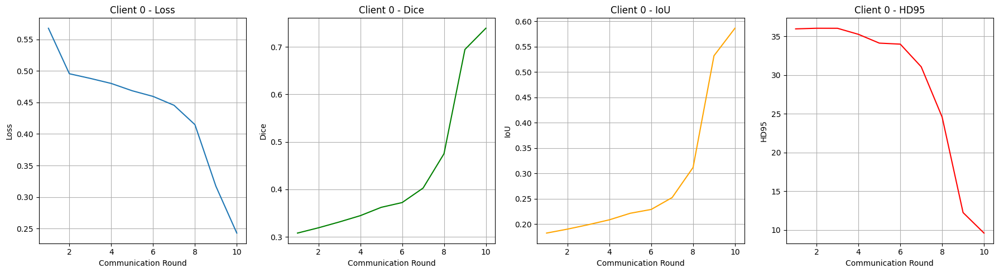

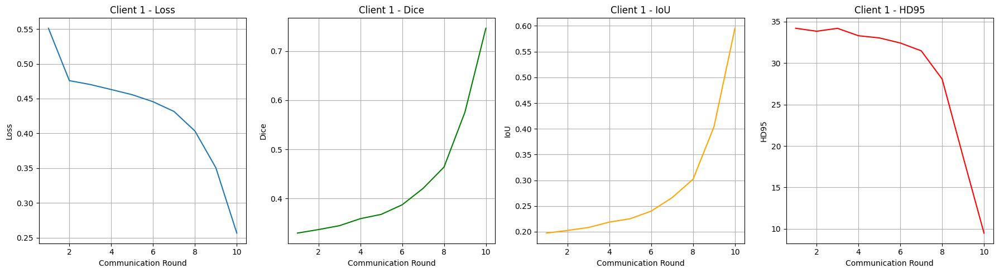

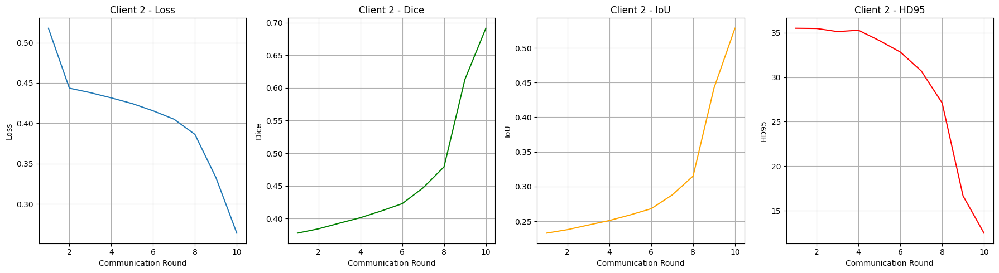

In [21]:
#local clients per communication round

for client_id, metrics in client_history.items():

    rounds = range(1, len(metrics["dice"]) + 1)

    plt.figure(figsize=(18, 5))

    # ----------------------------
    # Loss
    # ----------------------------
    plt.subplot(1, 4, 1)
    plt.plot(rounds, metrics["loss"])
    plt.xlabel("Communication Round")
    plt.ylabel("Loss")
    plt.title(f"Client {client_id} - Loss")
    plt.grid(True)

    # ----------------------------
    # Dice
    # ----------------------------
    plt.subplot(1, 4, 2)
    plt.plot(rounds, metrics["dice"], color="green")
    plt.xlabel("Communication Round")
    plt.ylabel("Dice")
    plt.title(f"Client {client_id} - Dice")
    plt.grid(True)

    # ----------------------------
    # IoU
    # ----------------------------
    plt.subplot(1, 4, 3)
    plt.plot(rounds, metrics["iou"], color="orange")
    plt.xlabel("Communication Round")
    plt.ylabel("IoU")
    plt.title(f"Client {client_id} - IoU")
    plt.grid(True)

    # ----------------------------
    # HD95
    # ----------------------------
    plt.subplot(1, 4, 4)
    plt.plot(rounds, metrics["hd95"], color="red")
    plt.xlabel("Communication Round")
    plt.ylabel("HD95")
    plt.title(f"Client {client_id} - HD95")
    plt.grid(True)

    plt.tight_layout()
    plt.show()

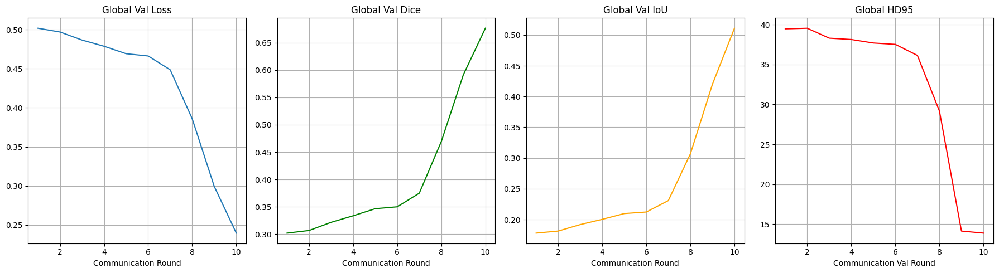

In [22]:
# Global Model per Communication Round
rounds = range(1, len(global_history["dice"]) + 1)

plt.figure(figsize=(18, 5))

plt.subplot(1,4,1)
plt.plot(rounds, global_history["loss"])
plt.xlabel("Communication Round")
plt.title("Global Val Loss")
plt.grid(True)

plt.subplot(1,4,2)
plt.plot(rounds, global_history["dice"], color="green")
plt.xlabel("Communication Round")
plt.title("Global Val Dice")
plt.grid(True)

plt.subplot(1,4,3)
plt.plot(rounds, global_history["iou"], color="orange")
plt.xlabel("Communication Round")
plt.title("Global Val IoU")
plt.grid(True)

plt.subplot(1,4,4)
plt.plot(rounds, global_history["hd95"], color="red")
plt.xlabel("Communication Val Round")
plt.title("Global HD95")
plt.grid(True)

plt.tight_layout()
plt.show()

**Test Set and Segmentation**

In [23]:
# -----------------------------
# 1️⃣ Load test set
# -----------------------------
test_dwi, test_masks = load_dwi_mask_pairs(os.path.join(data_dir, "test"))

test_dataset = ISLESDataset(
    dwi_files=test_dwi,
    mask_files=test_masks,
    image_transform=sample_transform,
    mask_transform=mask_transform
)

test_loader = DataLoader(test_dataset, batch_size=1, shuffle=False)
print("Test samples:", len(test_dataset))

# -----------------------------
# 2️⃣ Load best global model
# -----------------------------
best_model_ckpt = torch.load("best_global_model.pth")
global_model = create_model().to(device)
global_model.load_state_dict(best_model_ckpt["model_state_dict"])
global_model.eval()

# -----------------------------
# 3️⃣ Metrics setup
# -----------------------------
dice_metric = DiceMetric(include_background=False, reduction="mean")
hd_metric = HausdorffDistanceMetric(include_background=False, percentile=95, reduction="mean")

all_dice = []
all_hd95 = []
all_iou = []

from tqdm import tqdm

# -----------------------------
# 4️⃣ Evaluate on test set
# -----------------------------
global_model.eval()
all_dice = []
all_hd95 = []
all_iou = []

with torch.no_grad():
    test_bar = tqdm(test_loader, desc="Testing", leave=True)
    for batch_idx, batch in enumerate(test_bar):
        images = batch["image"].to(device, dtype=torch.float32)
        masks = batch["mask"].to(device, dtype=torch.float32)

        outputs = global_model(images)
        pred_binary = (torch.sigmoid(outputs) > 0.5).float()

        # Metrics
        dice_metric(pred_binary, masks)
        hd_metric(pred_binary, masks)

        # Optional: show running metrics in tqdm
        running_dice = dice_metric.aggregate().item()
        running_hd = hd_metric.aggregate().item()
        running_iou = running_dice / (2 - running_dice)
        test_bar.set_postfix({
            "Dice": f"{running_dice:.4f}",
            "IoU": f"{running_iou:.4f}",
            "HD95": f"{running_hd:.4f}"
        })

    # Final metrics
    mean_dice = dice_metric.aggregate().item()
    mean_hd95 = hd_metric.aggregate().item()
    mean_iou = mean_dice / (2 - mean_dice)

    print(f"\nTest Set Metrics:")
    print(f"Dice: {mean_dice:.4f}")
    print(f"IoU: {mean_iou:.4f}")
    print(f"HD95: {mean_hd95:.4f}")

    # Reset metrics for future use
    dice_metric.reset()
    hd_metric.reset()

C:\Users\LAB\AppData\Local\Temp\ipykernel_15724\1367524147.py:19: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  best_model_ckpt = torch.load("best_global_model.pth")


Test samples: 50
Factorizer(
  (stem): Conv3d(1, 32, kernel_size=(3, 3, 3), stride=(1, 1, 1), padding=(1, 1, 1), bias=False)
  (encoder): UNetEncoder(
    (blocks): ModuleList(
      (0): UNetEncoderBlock(
        (downsample): Identity()
        (block): FactorizerStage(
          (pos_embed): Identity()
          (blocks): ModuleList(
            (0): FactorizerBlock(
              (norm1): LayerNorm(
                (norm): LayerNorm((32,), eps=1e-05, elementwise_affine=True)
              )
              (fact): FactMixer(
                (in_proj): Linear(
                  (flatten): Flatten(start_dim=2, end_dim=-1)
                  (linear): Conv1d(32, 32, kernel_size=(1,), stride=(1,), bias=False)
                )
                (reshape): SWMatricize(
                  (shifted_windows): ModuleList(
                    (0-1): 2 x Matricize(
                      (rearrange): Rearrange('b (h d) (g0 p0) (g1 p1) (g2 p2) -> (b h) (g0 g1 g2) d (p0 p1 p2)', d=8, p0=2, p1=2, p2=2)

Testing:  46%|████▌     | 23/50 [00:05<00:06,  4.22it/s, Dice=0.6326, IoU=0.4626, HD95=16.7393]c:\Users\LAB\AppData\Local\Programs\Python\Python310\lib\site-packages\monai\metrics\utils.py:332: UserWarning: the prediction of class 0 is all 0, this may result in nan/inf distance.
  warnings.warn(
Testing:  54%|█████▍    | 27/50 [00:06<00:05,  4.26it/s, Dice=0.5665, IoU=0.3952, HD95=19.5679]c:\Users\LAB\AppData\Local\Programs\Python\Python310\lib\site-packages\monai\metrics\utils.py:327: UserWarning: the ground truth of class 0 is all 0, this may result in nan/inf distance.
  warnings.warn(
Testing: 100%|██████████| 50/50 [00:11<00:00,  4.26it/s, Dice=0.6434, IoU=0.4742, HD95=13.9943]


Test Set Metrics:
Dice: 0.6434
IoU: 0.4742
HD95: 13.9943


**Visualize**

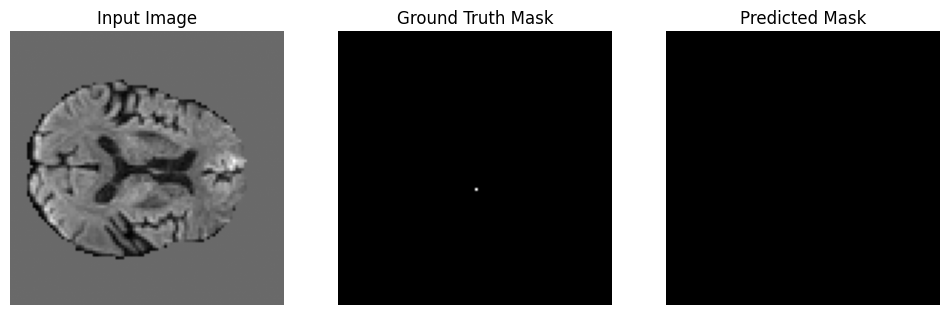

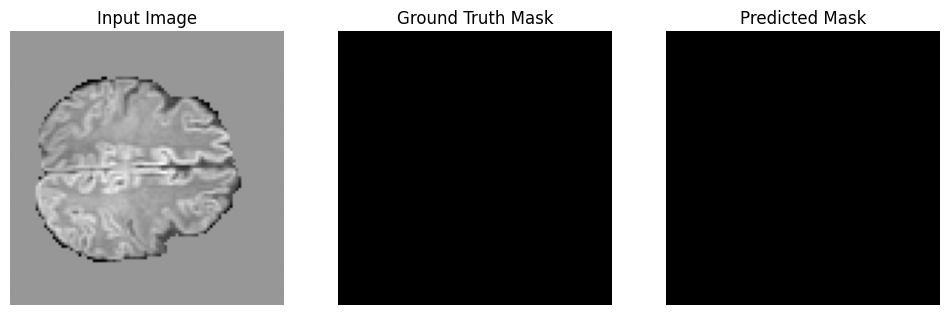

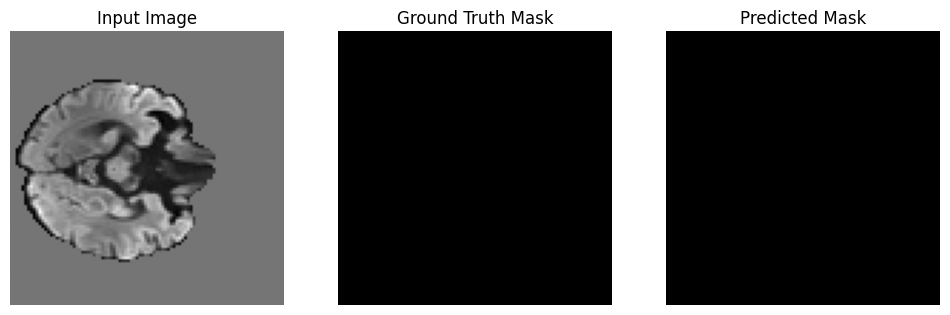

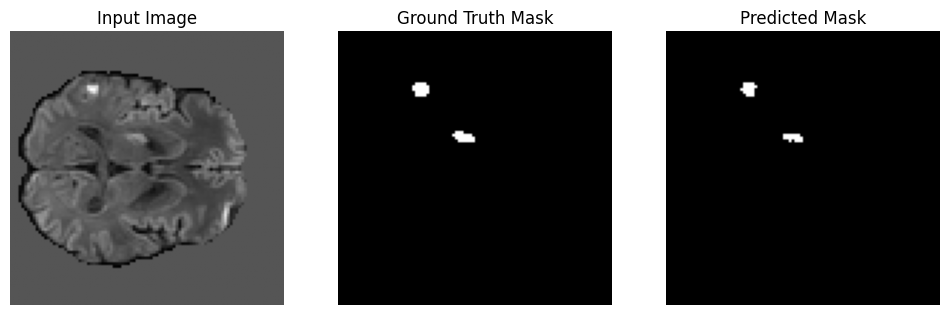

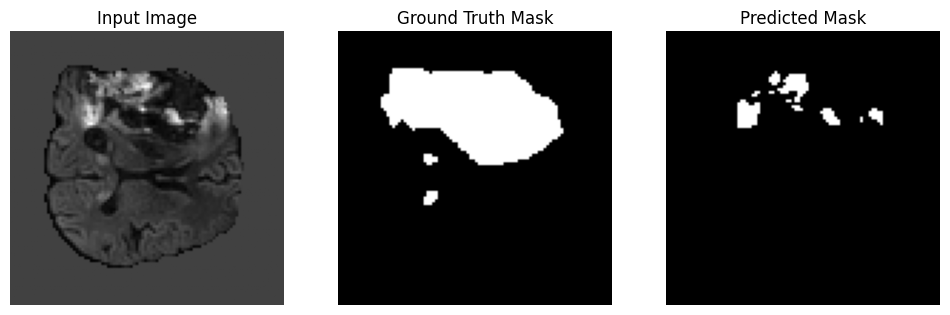

...

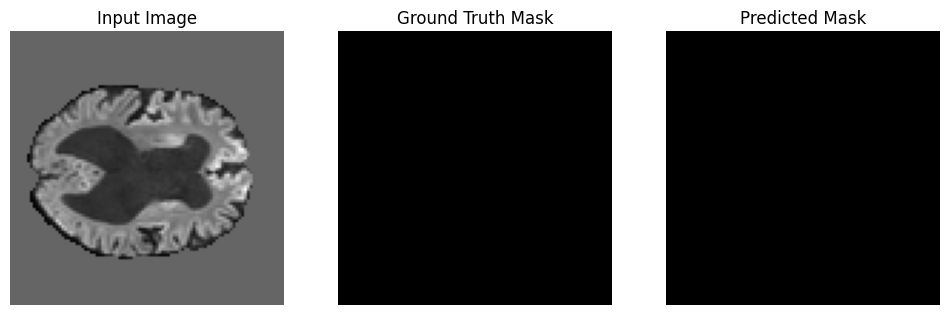

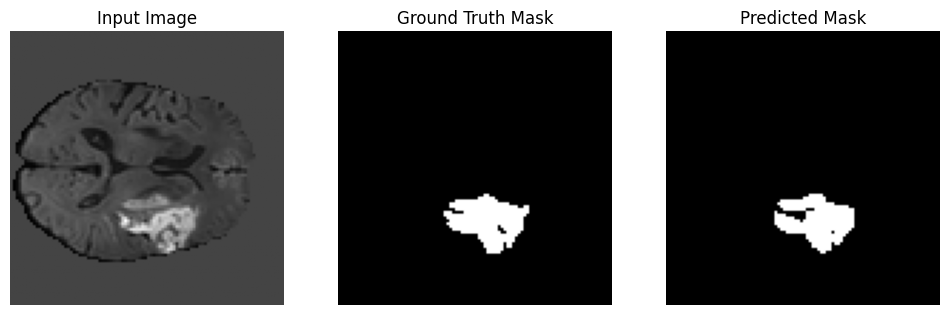

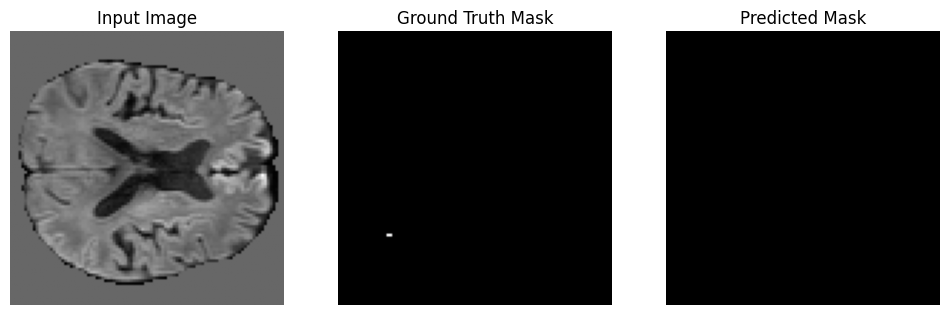

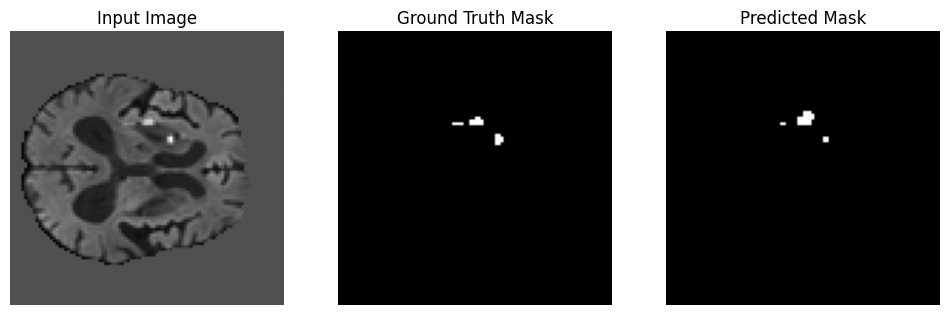

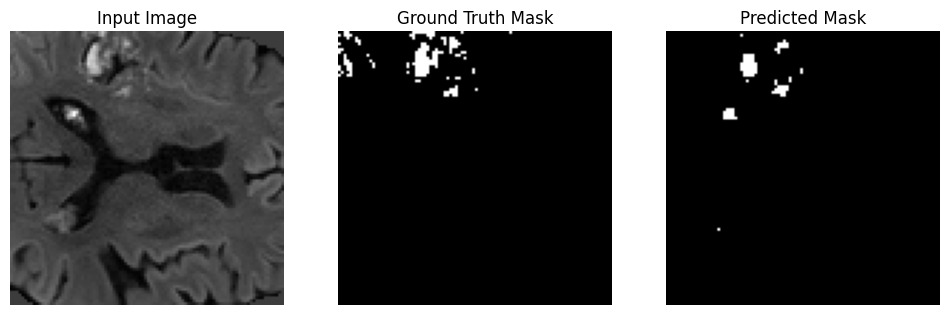

In [24]:
num_visualize = len(test_dataset)

global_model.eval()

for i in range(num_visualize):
    sample = test_dataset[i]

    # Get tensors
    image_tensor = sample["image"].unsqueeze(0).to(device, dtype=torch.float32)
    mask_tensor  = sample["mask"]

    # Convert for visualization
    image = sample["image"][0].cpu().numpy()
    mask  = sample["mask"][0].cpu().numpy()

    # Predict
    with torch.no_grad():
        output = global_model(image_tensor)
        pred = (torch.sigmoid(output)[0, 0].cpu().numpy() > 0.5).astype(float)

    # Middle slice
    mid_slice = image.shape[2] // 2
    img_slice  = image[:, :, mid_slice]
    mask_slice = mask[:, :, mid_slice]
    pred_slice = pred[:, :, mid_slice]

    # Plot
    plt.figure(figsize=(12,4))

    plt.subplot(1,3,1)
    plt.imshow(img_slice, cmap="gray")
    plt.title("Input Image")
    plt.axis("off")

    plt.subplot(1,3,2)
    plt.imshow(mask_slice, cmap="gray")
    plt.title("Ground Truth Mask")
    plt.axis("off")

    plt.subplot(1,3,3)
    plt.imshow(pred_slice, cmap="gray")
    plt.title("Predicted Mask")
    plt.axis("off")

    plt.show()